<font color='blue'> <h1> Обучение с учителем: качество модели

<font color='blue'> <h2>Описание проекта

Интернет-магазин «В один клик» продаёт разные товары: для детей, для дома, мелкую бытовую технику, косметику и даже продукты. Отчёт магазина за прошлый период показал, что активность покупателей начала снижаться. Привлекать новых клиентов уже не так эффективно: о магазине и так знает большая часть целевой аудитории. Возможный выход — удерживать активность постоянных клиентов. <b>Сделать это можно с помощью персонализированных предложений.</b><br><br>

«В один клик» — современная компания, поэтому её руководство не хочет принимать решения просто так — только на основе анализа данных и бизнес-моделирования. У компании есть небольшой отдел цифровых технологий, и вам предстоит побыть в роли стажёра в этом отделе. <br>
Итак, вашему отделу поручили разработать решение, которое позволит персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность.<br>
<br>
<b>Как решать задачу</b><br>
Подход к решению этой задачи:<br>
1.	Нужно промаркировать уровень финансовой активности постоянных покупателей. В компании принято выделять два уровня активности: «снизилась», если клиент стал покупать меньше товаров, и «прежний уровень».<br>
2.	Нужно собрать данные по клиентам по следующим группам: <br>
- Признаки, которые описывают коммуникацию сотрудников компании с клиентом.<br>
- Признаки, которые описывают продуктовое поведение покупателя. Например, какие товары покупает и как часто.<br>
- Признаки, которые описывают покупательское поведение клиента. Например, сколько тратил в магазине.<br>
- Признаки, которые описывают поведение покупателя на сайте. Например, как много страниц просматривает и сколько времени проводит на сайте.<br>
Группы признаков представлены (вместе с целевым) в виде диаграммы — такую визуализацию ещё называют диаграммой Исикавы.<br>
<br>
<br>
<b>ЧТО НУЖНО СДЕЛАТЬ:</b><br>
1.	Нужно построить модель, которая предскажет вероятность снижения покупательской активности клиента в следующие три месяца.
2.	В исследование нужно включить дополнительные данные финансового департамента о прибыльности клиента: какой доход каждый покупатель приносил компании за последние три месяца.<br>
3.	Используя данные модели и данные о прибыльности клиентов, нужно выделить сегменты покупателей и разработать для них персонализированные предложения.<br>
Руководство одобрило описание решения, и вам, как специалисту по DS, нужно его реализовать.<br>



In [ ]:
%%capture
!pip install -U scikit-learn

# install phik (if not installed yet)
import sys
!"{sys.executable}" -m pip install phik

!pip install shap
import shap


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import phik
import seaborn as sns

# импортируем функцию
from phik import phik_matrix
from phik.report import plot_correlation_matrix

from IPython.display import Image

# pipeline
# загружаем нужные классы
# класс ColumnTransformer помогает работать с данными разного типа в одном наборе
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix


# загружаем дополнительные классы для преобразования данных
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    MinMaxScaler,
    # добавьте нужное
    RobustScaler
)

# загрузите инструмент для автоподбора гиперпараметров
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

# загружаем класс для работы с пропусками
from sklearn.impute import SimpleImputer

# загружаем нужные метрики
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score

# импортируем модель
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import LabelEncoder

from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

<font color='blue'> <h2>  Описание данных<br>

Данные для работы находятся в нескольких таблицах.<br>
<br>
<b>market_file.csv</b><br><br>
Таблица, которая содержит данные о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.<br>
- id - номер покупателя в корпоративной базе данных.<br>
- Покупательская активность - рассчитанный класс покупательской активности (целевой признак): «снизилась» или «прежний уровень».<br>
- Тип сервиса - уровень сервиса, например «премиум» и «стандарт».<br>
- Разрешить сообщать - информация о том, можно ли присылать покупателю дополнительные предложения о товаре. Согласие на это даёт покупатель.<br>
- Маркет_актив_6_мес - среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента.
- Маркет_актив_тек_мес - количество маркетинговых коммуникаций в текущем месяце.<br>
- Длительность - значение, которое показывает, сколько дней прошло с момента регистрации покупателя на сайте.<br>
- Акционные_покупки — среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев.<br>
- Популярная_категория — самая популярная категория товаров у покупателя за последние 6 месяцев.<br>
- Средний_просмотр_категорий_за_визит - показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца.<br>
- Неоплаченные_продукты_штук_квартал - общее число неоплаченных товаров в корзине за последние 3 месяца.<br>
- Ошибка_сервиса - число сбоев, которые коснулись покупателя во время посещения сайта.<br>
- Страниц_за_визит - среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.<br>
<br>
<b>market_money.csv</b><br><br>
Таблица с данными о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.<br>
- id - номер покупателя в корпоративной базе данных.<br>
- Период - название периода, во время которого зафиксирована выручка. Например,'текущий_месяц' или 'предыдущий_месяц'.<br>
- Выручка - сумма выручки за период.<br>
<br>
<b>market_time.csv</b><br><br>
Таблица с данными о времени (в минутах), которое покупатель провёл на сайте в течение периода.<br>
- id - номер покупателя в корпоративной базе данных.<br>
- Период - название периода, во время которого зафиксировано общее время.<br>
- минут - значение времени, проведённого на сайте, в минутах.<br>
<br>
<b>money.csv</b><br><br>
Таблица с данными о среднемесячной прибыли покупателя за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.<br>
- id - номер покупателя в корпоративной базе данных.<br>
- Прибыль - значение прибыли.<br>

In [ ]:
#Image("https://i.imgur.com/6CtR1Vu.png")

<font color='blue'> <h2> Шаг 1. Загрузка данных

1.1 Загрузим данные. <br>
Файлы market_file.csv, market_money.csv, market_time.csv, money.csv доступны по ссылкам в описании данных или через пути к ним:<br>
/datasets/market_file.csv<br>
/datasets/market_money.csv<br>
/datasets/market_time.csv<br>
/datasets/money.csv<br>
Обратите внимание: в некоторых файлах разделитель значений - точка с запятой, а разделитель десятичных значений - запятая. <br>
1.2 Проверим, что данные в таблицах соответствуют описанию. Исследованием и объединением данных займёмся позже.<br>

In [ ]:
# Загрузим данные с учётом разделителей и сразу заменим тип данных на соответствующий своему типу методом decimal = ','
market_file = pd.read_csv('market_file.csv', sep = ',', decimal = ',')
market_file.head(5)

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.0,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


In [ ]:
# Загрузим данные
market_money = pd.read_csv('market_money.csv', sep = ',', decimal = ',')
market_money.head()

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [ ]:
# Загрузим данные
market_time = pd.read_csv('market_time.csv', sep = ',', decimal = ',')
market_time.head()

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [ ]:
# Загрузим данные
money = pd.read_csv('money.csv', sep = ';', decimal = ',')
money.head()

,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


<font color='blue'> <h2> Шаг 2. Предобработка данных

Проведём необходимую предобработку данных. Названия столбцов оставим кириллическими.

<b>Предобработаем таблицу, которая содержит данные о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.

In [ ]:
# информация о данных
market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   id                                   1300 non-null   int64 
 1   Покупательская активность            1300 non-null   object
 2   Тип сервиса                          1300 non-null   object
 3   Разрешить сообщать                   1300 non-null   object
 4   Маркет_актив_6_мес                   1300 non-null   object
 5   Маркет_актив_тек_мес                 1300 non-null   int64 
 6   Длительность                         1300 non-null   int64 
 7   Акционные_покупки                    1300 non-null   object
 8   Популярная_категория                 1300 non-null   object
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64 
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64 
 11  Ошибка_сервиса                       1300 n

In [ ]:
# нижний регистор, убрать пробелы
market_file.columns = market_file.columns.str.lower()
market_file.columns = market_file.columns.str.replace(" ", "_")
market_file.head(1)

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.0,Товары для детей,6,2,1,5


In [ ]:
# заменить тип данных
market_file['маркет_актив_6_мес'] = market_file['маркет_актив_6_мес'].astype('float64')
market_file['акционные_покупки'] = market_file['акционные_покупки'].astype('float64')
market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   1300 non-null   int64  
 1   покупательская_активность            1300 non-null   object 
 2   тип_сервиса                          1300 non-null   object 
 3   разрешить_сообщать                   1300 non-null   object 
 4   маркет_актив_6_мес                   1300 non-null   float64
 5   маркет_актив_тек_мес                 1300 non-null   int64  
 6   длительность                         1300 non-null   int64  
 7   акционные_покупки                    1300 non-null   float64
 8   популярная_категория                 1300 non-null   object 
 9   средний_просмотр_категорий_за_визит  1300 non-null   int64  
 10  неоплаченные_продукты_штук_квартал   1300 non-null   int64  
 11  ошибка_сервиса                

In [ ]:
# посчитать пустые значения в столбцах
market_file.isna().sum()

id                                     0
покупательская_активность              0
тип_сервиса                            0
разрешить_сообщать                     0
маркет_актив_6_мес                     0
маркет_актив_тек_мес                   0
длительность                           0
акционные_покупки                      0
популярная_категория                   0
средний_просмотр_категорий_за_визит    0
неоплаченные_продукты_штук_квартал     0
ошибка_сервиса                         0
страниц_за_визит                       0
dtype: int64

In [ ]:
# проверить полные дубликаты в базе ferma_main.
market_file.duplicated().sum()

0

<b>Предобработаем таблицу с данными о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.

In [ ]:
# информация о данных
market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       3900 non-null   int64 
 1   Период   3900 non-null   object
 2   Выручка  3900 non-null   object
dtypes: int64(1), object(2)
memory usage: 91.5+ KB


In [ ]:
# нижний регистор, сменить тип данных
market_money.columns = market_money.columns.str.lower()
market_money['выручка'] = market_money['выручка'].astype('float64')

In [ ]:
# проверка дубликатов
market_money.duplicated().sum()

0

<b>Предобработаем таблицу с данными о среднемесячной прибыли покупателя за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.

In [ ]:
# информация о данных
money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


In [ ]:
# пробелы
money.isna().sum()

id         0
Прибыль    0
dtype: int64

<b>Предобработаем таблицу с данными о времени (в минутах), которое покупатель провёл на сайте в течение периода.

In [ ]:
# информация о данных
market_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


In [ ]:
# нижний регистор
market_time.columns = market_time.columns.str.lower()

In [ ]:
# запрос уникальных значений
market_time['период'].unique()

array(['текущий_месяц', 'предыдцщий_месяц'], dtype=object)

In [ ]:
# преобразование таблицы
current_time = market_time[market_time['период'] == 'текущий_месяц'].drop('период', axis=1).rename(columns ={'минут': 'тек_мес_время'}).set_index('id')
previous_time = market_time[market_time['период'] == 'предыдцщий_месяц'].drop('период', axis=1).rename(columns ={'минут': 'пред_мес_время'}).set_index('id')
market_time_new = previous_time.join(current_time, rsuffix = 'outer')
market_time_new.head()

,пред_мес_время,тек_мес_время
id,,
215348,13,14
215349,12,10
215350,8,13
215351,11,13
215352,8,11


In [ ]:
# информация о преобразованных данных
market_time_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1300 entries, 215348 to 216647
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   пред_мес_время  1300 non-null   int64
 1   тек_мес_время   1300 non-null   int64
dtypes: int64(2)
memory usage: 62.8 KB


<b>Данные изучены, подготовлены к исследованию.</b>

<font color='blue'> <h2> Шаг 3. Исследовательский анализ данных

Проведём исследовательский анализ данных из каждой таблицы. Отберём клиентов с покупательской активностью не менее трёх месяцев, то есть таких, которые что-либо покупали в этот период. Оформим выводы по результатам шага.

Проведём статистический анализ всех признаков.<br>
<b>1) Построим графики, которые описывают все признаки.</b> <br>
Для количественных графиков построим гистограммы и ящики с усами, а для категориальных данных посмотрим рапределение значений.<br>

<b>market_file.csv - исследовательский анализ данных

In [ ]:
# статистическая информация о данных
market_file.describe(percentiles = [0.25, 0.50, 0.75])

,id,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
count,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.00000,1300.000000,1300.000000,1300.000000
mean,215997.500000,4.253769,4.011538,601.898462,0.319808,3.27000,2.840000,4.185385,8.176923
std,375.421985,1.014814,0.696868,249.856289,0.249843,1.35535,1.971451,1.955298,3.978126
min,215348.000000,0.900000,3.000000,110.000000,0.000000,1.00000,0.000000,0.000000,1.000000
25%,215672.750000,3.700000,4.000000,405.500000,0.170000,2.00000,1.000000,3.000000,5.000000
50%,215997.500000,4.200000,4.000000,606.000000,0.240000,3.00000,3.000000,4.000000,8.000000
75%,216322.250000,4.900000,4.000000,806.000000,0.300000,4.00000,4.000000,6.000000,11.000000
max,216647.000000,6.600000,5.000000,1079.000000,0.990000,6.00000,10.000000,9.000000,20.000000


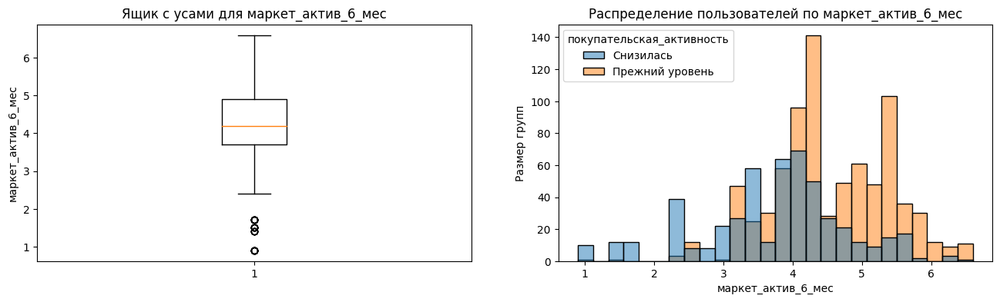

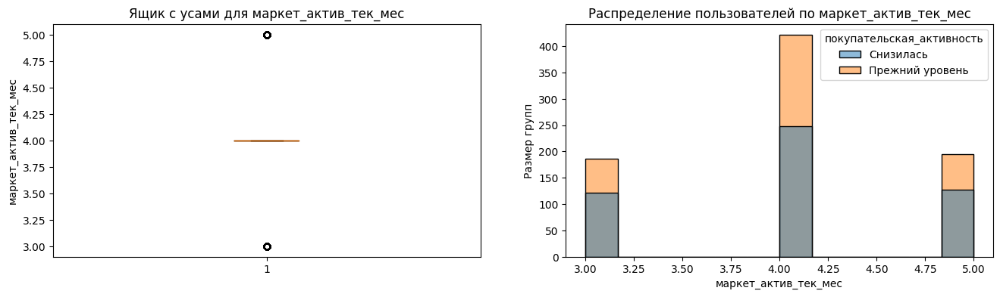

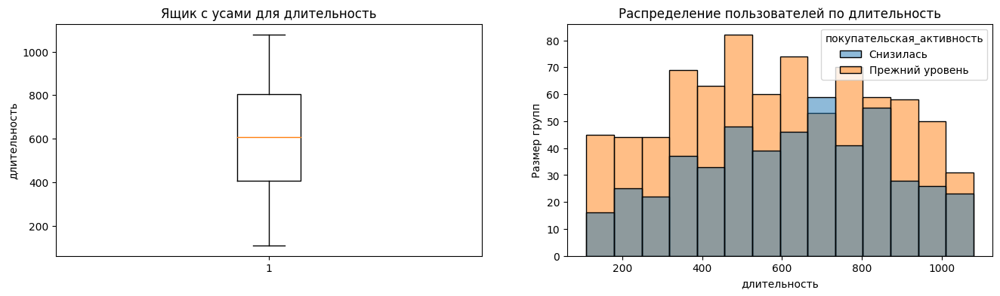

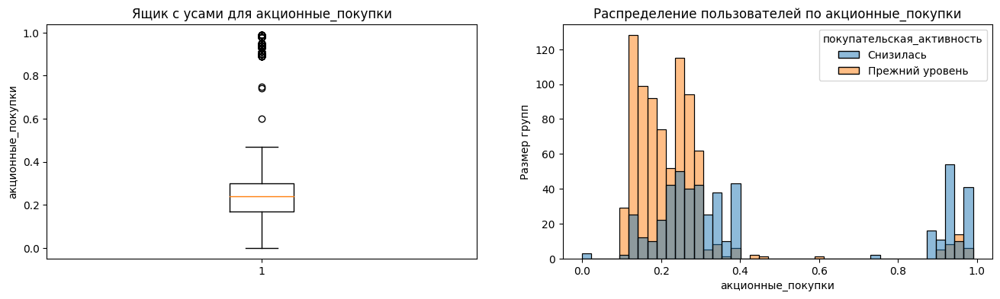

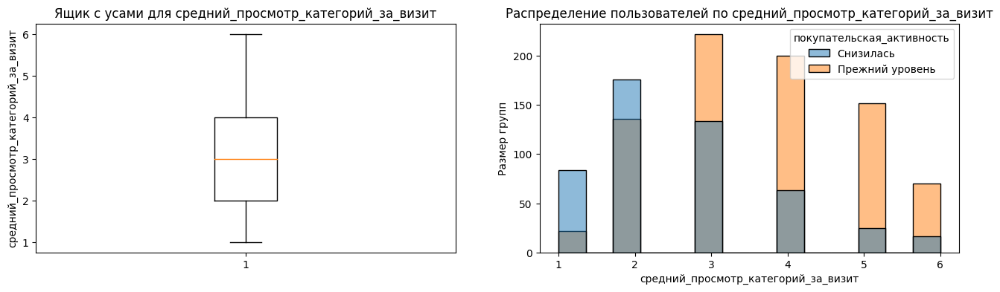

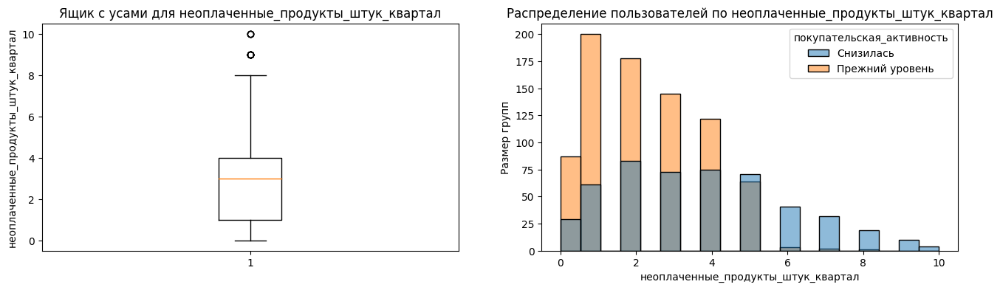

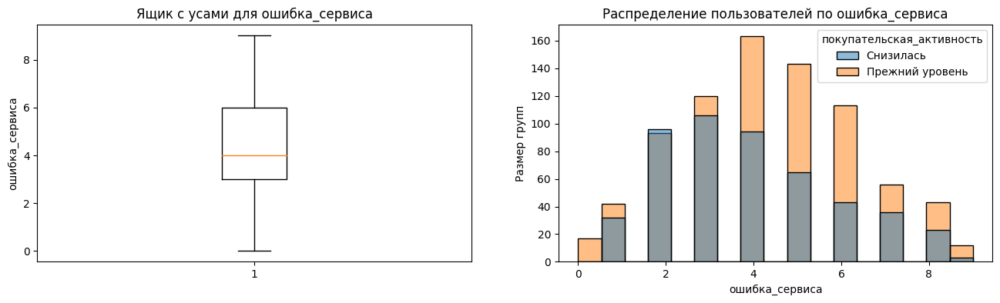

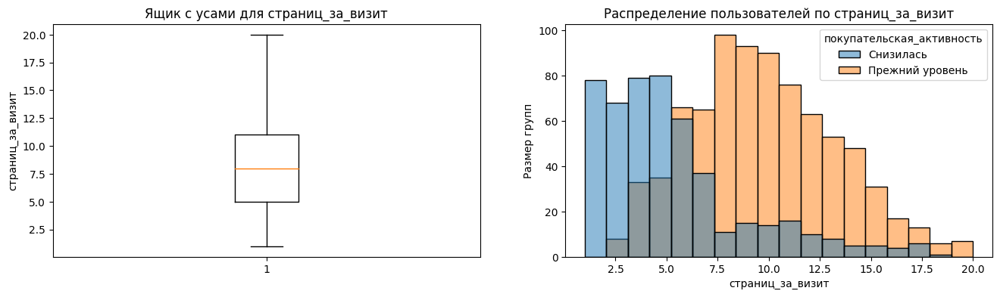

In [ ]:
# вывод графического отображения цифровых данных из табилцы market_file.scv
def boxplot_hist_figure(categories):

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))

    axes[0].boxplot(market_file[categories])
    axes[0].set_title("Ящик с усами для "+str(categories))
    axes[0].set_ylabel(str(categories));

    sns.histplot(data=market_file, x=categories, hue='покупательская_активность')
    axes[1].set_xlabel(str(categories))
    axes[1].set_ylabel("Размер групп")
    axes[1].set_title("Распределение пользователей по "+str(categories));

# Список названий столбцов имеющих числовые признаки
numeric_list = market_file.select_dtypes(include=["number"]).columns[1:11]

# С помощью цикла выведем все графики
for categories in numeric_list:
    boxplot_hist_figure(categories)

<b>Зависимости в данных, которые определяют снижение покупательской активности:</b> <br>
1) Уменьшение страниц за визит. <br>
2) Увеличение неоплаченных товаров в корзине.<br>
3) Снижение просмотров категорий.<br>
4) Покупки по акции.<br><br>
<b>Зависимости в данных, которые определяют увеличение покупательской активности:</b><br>
1) Маркетинговая активность за последние полгода от магазина "доставшаяся" клиенту<br>

In [ ]:
# столбцы с категориальными признаками в таблице market_file.csv
list(market_file.select_dtypes(include=['object']))

['покупательская_активность',
 'тип_сервиса',
 'разрешить_сообщать',
 'популярная_категория']

покупательская_активность
Прежний уровень    802
Снизилась          498
Name: покупательская_активность, dtype: int64


тип_сервиса
стандарт     914
премиум      376
стандартт     10
Name: тип_сервиса, dtype: int64


разрешить_сообщать
да     962
нет    338
Name: разрешить_сообщать, dtype: int64


популярная_категория
Товары для детей                        330
Домашний текстиль                       251
Косметика и аксесуары                   223
Техника для красоты и здоровья          184
Мелкая бытовая техника и электроника    174
Кухонная посуда                         138
Name: популярная_категория, dtype: int64




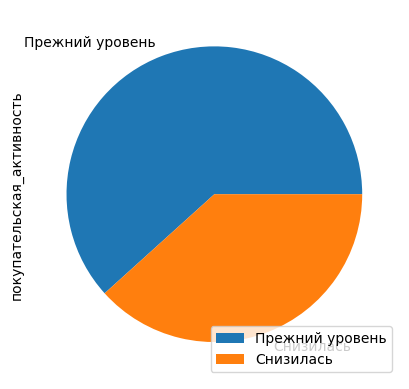

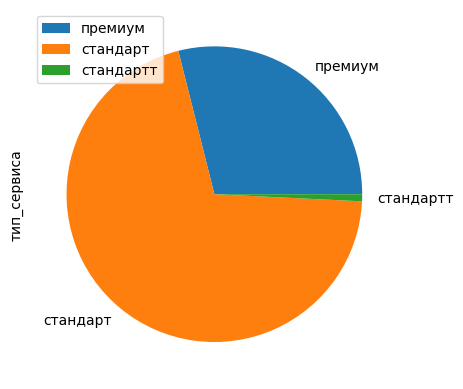

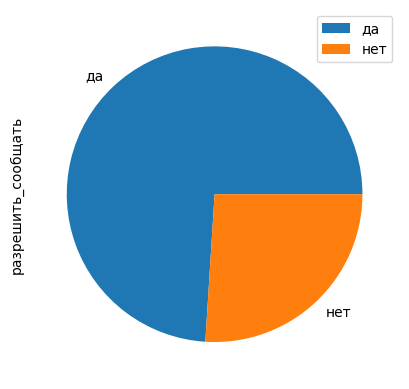

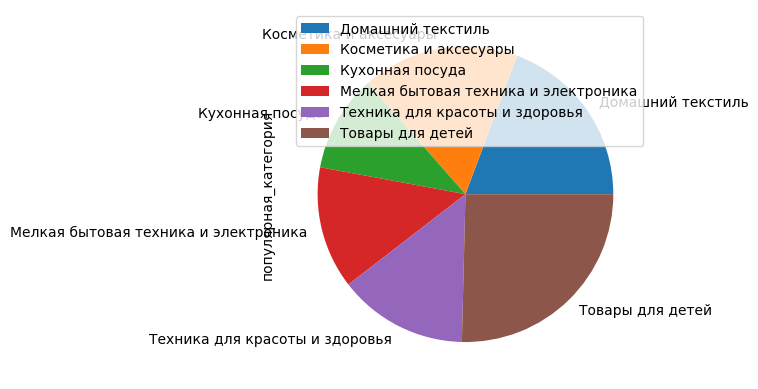

In [ ]:
# подсчёт распределений категориальных значений
def set_categories(categories):
    print(market_file.groupby(categories)[categories].count().sort_values(ascending=False).head(10))
    print()
    table = pd.pivot_table(market_file, values='id', index=[categories], aggfunc="count")
    table=table.rename(columns ={'id': categories})
    table.plot(kind='pie', y=categories)
    print()

# Список названий столбцов имеющих категориальные признаки
categoriesc_list = market_file.select_dtypes(include=['object']).columns[0:11]

# С помощью цикла выведем все графики
for categories in categoriesc_list:
    set_categories(categories)

1. Наблюдается дисбаланс классов "покупательская_активность" Прежний уровень 802, Снизилась 498<br>
2. Остальные распределения номальны, за исключением акционных покупок - наблюдается выброс<br>

In [ ]:
# Заменим стандартт на стандарт
market_file['тип_сервиса'] = market_file['тип_сервиса'].replace('стандартт', 'стандарт')

<b>money.csv - исследовательский анализ данных

Исследовательский анализ данных о среднемесячной прибыли покупателя за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.

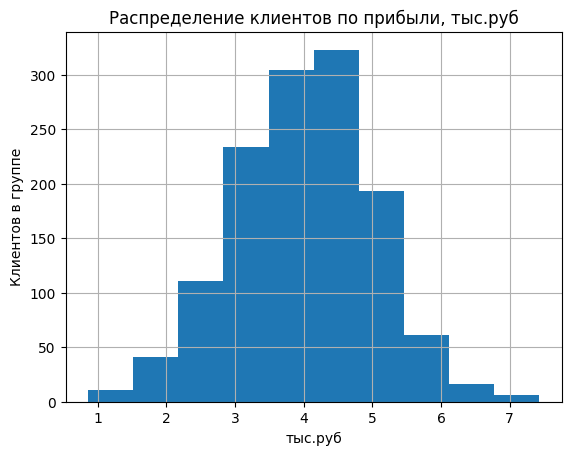

In [ ]:
# Распределение клиентов по прибыли, тыс.руб
money['Прибыль'].hist()
plt.title("Распределение клиентов по прибыли, тыс.руб")
plt.xlabel("тыс.руб")
plt.ylabel("Клиентов в группе");

In [ ]:
# проверка нулевых значений
money[money['Прибыль'] <= 0]

,id,Прибыль


<b>market_money.csv - исследовательский анализ данных

<b>2) Отберём клиентов с покупательской активностью не менее трёх месяцев, то есть таких, которые что-либо покупали в этот период. </b><br>
Посмотрим на данные. Отберём тех, которые что-либо покупали в этот период. <br>
Воспользуемся таблицей с данными о выручке, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.<br>

market_money.csv<br>
id - номер покупателя в корпоративной базе данных.<br>
Период - название периода, во время которого зафиксирована выручка. Например,'текущий_месяц' или 'предыдущий_месяц'.<br>
<br>
Надо отобрать покупателей у которых на протяжении трёх периодов не было покупок.<br>
В таблице собраны данные о 1300 покупателях с суммами покупок за 3 мес., помесячно. Соберём их в таблицу с сортировкой данных по id

In [ ]:
# динамика доходов
market_money.groupby('период')['выручка'].sum().sort_values(ascending=False)

период
текущий_месяц          6909449.1
предыдущий_месяц       6417996.5
препредыдущий_месяц    6272769.0
Name: выручка, dtype: float64

In [ ]:
# соберём данные относительно id и периода трат
current_month = market_money[market_money['период'] == 'текущий_месяц'].drop('период', axis=1).rename(columns ={'выручка': 'тек_мес_траты'}).set_index('id')
previous_month = market_money[market_money['период'] == 'предыдущий_месяц'].drop('период', axis=1).rename(columns ={'выручка': 'пред_мес_траты'}).set_index('id')
prepre_month = market_money[market_money['период'] == 'препредыдущий_месяц'].drop('период', axis=1).rename(columns ={'выручка': 'препред_мес_траты'}).set_index('id')
market_money_new = prepre_month.join(previous_month, rsuffix = 'outer').join(current_month, rsuffix = 'outer')
market_money_new.head()

,препред_мес_траты,пред_мес_траты,тек_мес_траты
id,,,
215348,0.0,0.0,3293.1
215349,4472.0,5216.0,4971.6
215350,4826.0,5457.5,5058.4
215351,4793.0,6158.0,6610.4
215352,4594.0,5807.5,5872.5


In [ ]:
# проверим отсутствие покупательской активности
market_money_new[(market_money_new['препред_мес_траты'] == 0) | (market_money_new['пред_мес_траты'] == 0)\
                 | (market_money_new['тек_мес_траты'] == 0)]

,препред_мес_траты,пред_мес_траты,тек_мес_траты
id,,,
215348,0.0,0.0,3293.1
215357,0.0,0.0,5986.3
215359,0.0,0.0,4735.0


In [ ]:
# Проверим соответствие индексов в двух базах market_money_new и market_file
market_money_new.reset_index()['id'][~market_file['id'].isin(market_money_new.reset_index()['id'])]

Series([], Name: id, dtype: int64)

In [ ]:
# Проверим соответствие индексов в двух базах market_money_new и money
market_money_new.reset_index()['id'][~money['id'].isin(market_money_new.reset_index()['id'])]

Series([], Name: id, dtype: int64)

<b>3) Оформим выводы по результатам шага.</b><br>
Все покупатели в базе - активные клиенты, кроме 3-х клиентов.<br>
Удалим записи с этими id после объёдинения таблиц.<br>
Обороты растут.<br>
Записи в базах данных соответсвуют по параметру id на 100%

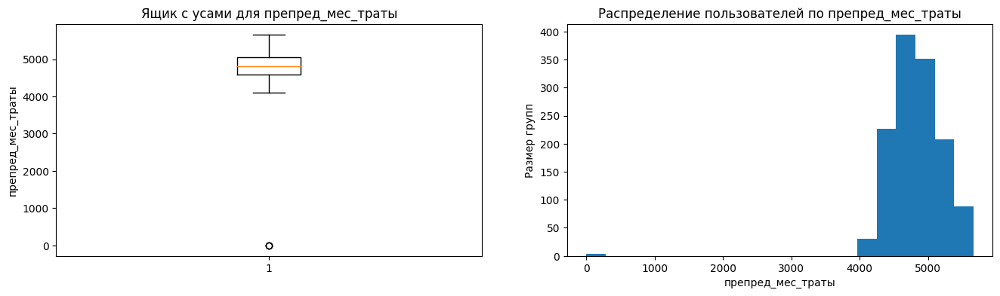

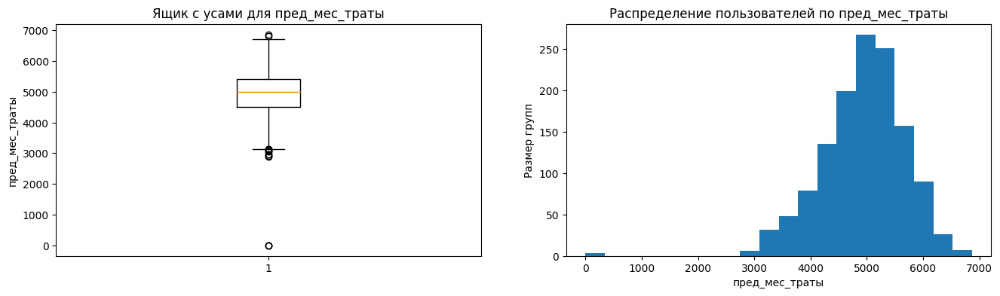

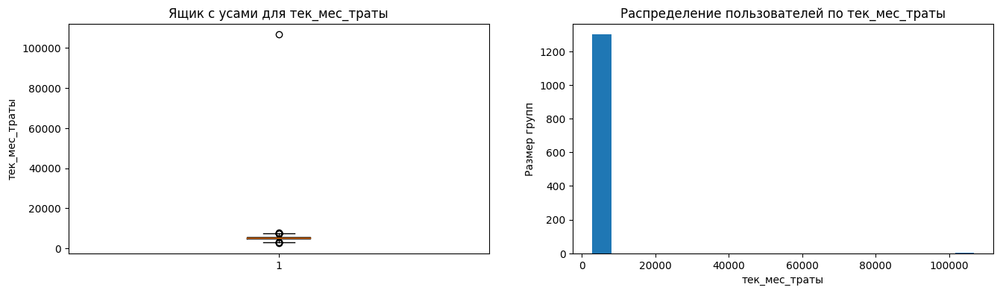

In [ ]:
# вывод графического отображения цифровых данных из табилцы market_money_new.scv
def boxplot_hist_figure2(categories):

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))

    axes[0].boxplot(market_money_new[categories])
    axes[0].set_title("Ящик с усами для "+str(categories))
    axes[0].set_ylabel(str(categories));

    axes[1].hist(market_money_new[categories], bins = 20)
    axes[1].set_xlabel(str(categories))
    axes[1].set_ylabel("Размер групп")
    axes[1].set_title("Распределение пользователей по "+str(categories));

# Список названий столбцов имеющих числовые признаки
numeric_list2 = market_money_new.select_dtypes(include=["number"]).columns[0:11]

# С помощью цикла выведем все графики
for categories in numeric_list2:
    boxplot_hist_figure2(categories)

Наблюдаются выбросы по покупкам в текущем месяце, а также нулевые траты в предыдущих.

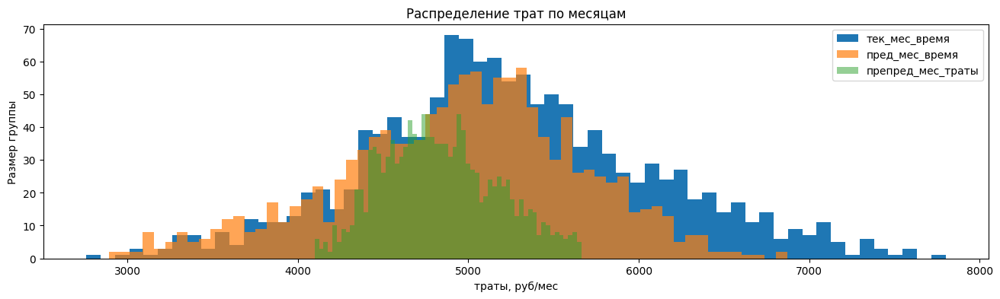

In [ ]:
# удалить выбросы
market_money_new_x = market_money_new[(market_money_new['препред_мес_траты'] > 0) & (market_money_new['тек_мес_траты'] <= 10000)]

# построить гистограммы
fig, axes = plt.subplots(1, figsize=(16, 4))

plt.hist(market_money_new_x['тек_мес_траты'], bins=60, alpha = 1)
plt.hist(market_money_new_x['пред_мес_траты'], bins=60, alpha = 0.7)
plt.hist(market_money_new_x['препред_мес_траты'], bins=60, alpha = 0.5)
plt.xlabel('траты, руб/мес')
plt.ylabel("Размер группы")
plt.legend(["тек_мес_время", "пред_мес_время", 'препред_мес_траты'])
plt.title("Распределение трат по месяцам");

In [ ]:
market_money_new_x.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1296 entries, 215349 to 216647
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   препред_мес_траты  1296 non-null   float64
 1   пред_мес_траты     1296 non-null   float64
 2   тек_мес_траты      1296 non-null   float64
dtypes: float64(3)
memory usage: 40.5 KB


Траты клиентов растут

<b>market_time.csv - исследовательский анализ данных

In [ ]:
market_time_new.head()

,пред_мес_время,тек_мес_время
id,,
215348,13,14
215349,12,10
215350,8,13
215351,11,13
215352,8,11


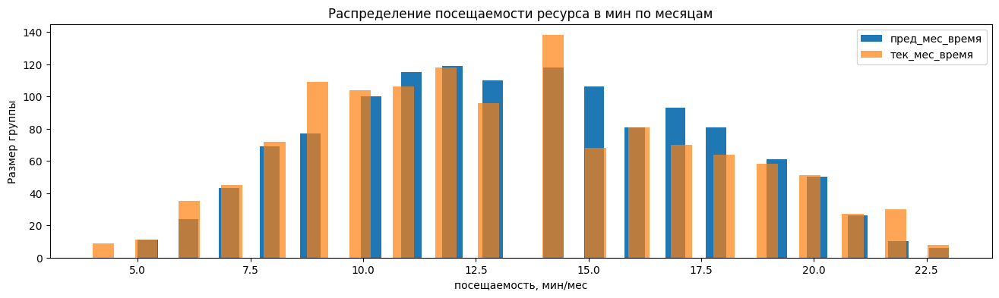

In [ ]:
# построить гистограммы
fig, axes = plt.subplots(1, figsize=(16, 4))

plt.hist(market_time_new['пред_мес_время'], bins=40, alpha = 1)
plt.hist(market_time_new['тек_мес_время'], bins=40, alpha = 0.7)
plt.xlabel('посещаемость, мин/мес')
plt.ylabel("Размер группы")
plt.legend(["пред_мес_время", "тек_мес_время"])
plt.title("Распределение посещаемости ресурса в мин по месяцам");

Длительности сеансов посещений распределены по месяцам равномерно

<font color='blue'> <h2>  Шаг 4. Объединение таблиц

4.1 Объединим таблицы market_file.csv, market_money.csv, market_time.csv. Данные о прибыли из файла money.csv при моделировании на этом этапе не понадобятся. <br>
4.2 Учтём, что данные о выручке и времени на сайте находятся в одном столбце для всех периодов. В итоговой таблице сделаем отдельный столбец для каждого периода.<br>

In [ ]:
market = market_file.set_index('id').join(market_money_new, rsuffix= 'outer').join(market_time_new, rsuffix= 'outer')
market.head()

,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,препред_мес_траты,пред_мес_траты,тек_мес_траты,пред_мес_время,тек_мес_время
id,,,,,,,,,,,,,,,,,
215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5,0.0,0.0,3293.1,13,14
215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4472.0,5216.0,4971.6,12,10
215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,4826.0,5457.5,5058.4,8,13
215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,4793.0,6158.0,6610.4,11,13
215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,4594.0,5807.5,5872.5,8,11


In [ ]:
# удалим записи некативных клиентов и выбросы в тратах текущего месяца
market = market[(market['препред_мес_траты'] > 0) & (market['тек_мес_траты'] <= 10000)]

In [ ]:
market.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1296 entries, 215349 to 216647
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   покупательская_активность            1296 non-null   object 
 1   тип_сервиса                          1296 non-null   object 
 2   разрешить_сообщать                   1296 non-null   object 
 3   маркет_актив_6_мес                   1296 non-null   float64
 4   маркет_актив_тек_мес                 1296 non-null   int64  
 5   длительность                         1296 non-null   int64  
 6   акционные_покупки                    1296 non-null   float64
 7   популярная_категория                 1296 non-null   object 
 8   средний_просмотр_категорий_за_визит  1296 non-null   int64  
 9   неоплаченные_продукты_штук_квартал   1296 non-null   int64  
 10  ошибка_сервиса                       1296 non-null   int64  
 11  страниц_за_визит            

По заданию мы убираем клиентов которые не проявили активность хотя бы в одном из 3 месяцев

    



<font color='blue'> <h2>  Шаг 5. Корреляционный анализ

Проведите корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования. Сделайте выводы о мультиколлинеарности и при необходимости устраните её.


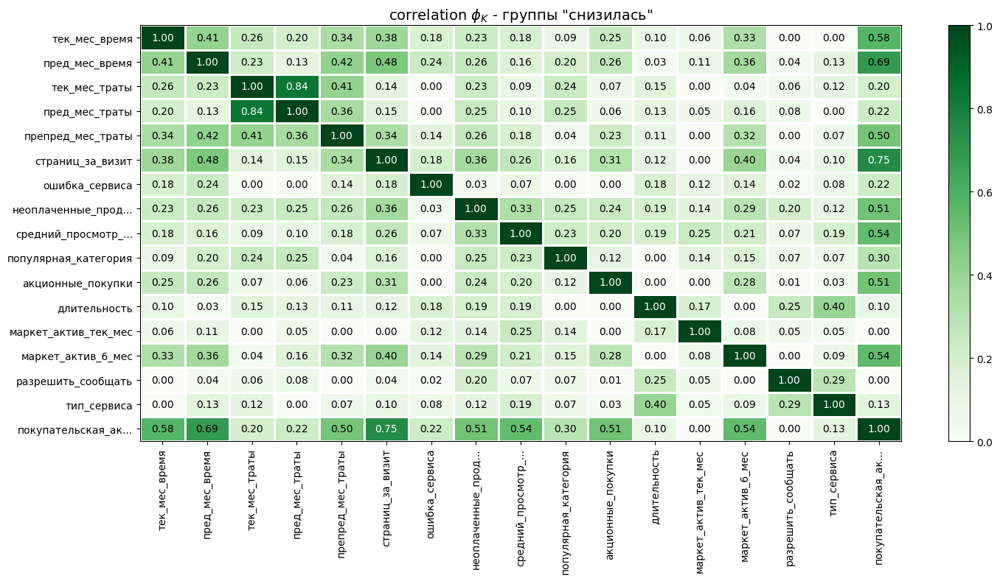

In [ ]:
# корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования
interval_cols=['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', \
               'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', \
               'страниц_за_визит', 'препред_мес_траты', 'пред_мес_траты', 'тек_мес_траты', 'пред_мес_время', 'тек_мес_время']
phik_overview = phik_matrix(market, interval_cols=interval_cols)
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$ - группы "снизилась"',
    fontsize_factor=1.0,
    figsize=(15, 8)
)

/usr/local/lib/python3.10/dist-packages/phik/data_quality.py:72: UserWarning: Not enough unique value for variable покупательская_активность for analysis 1. Dropping this column
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/phik/data_quality.py:72: UserWarning: Not enough unique value for variable покупательская_активность for analysis 1. Dropping this column
  warnings.warn(


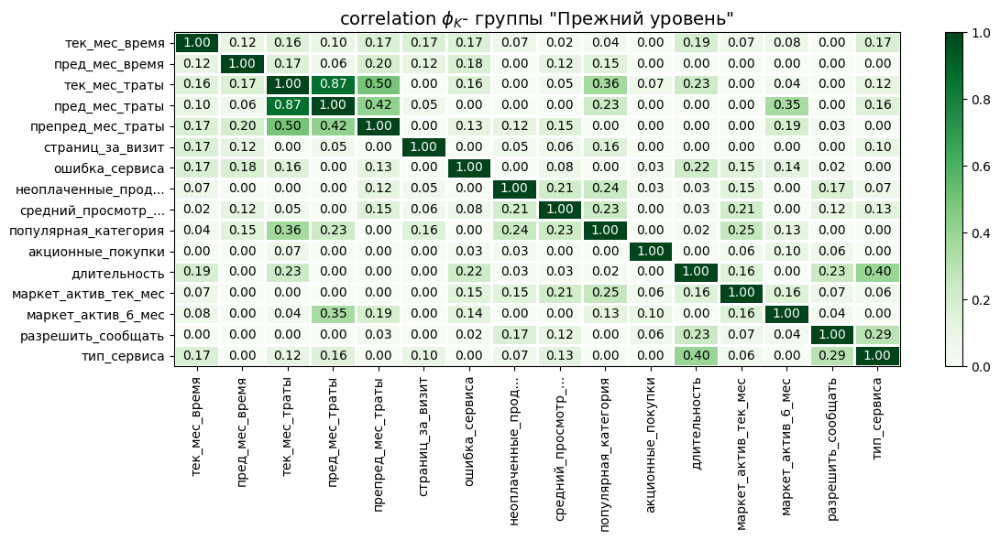

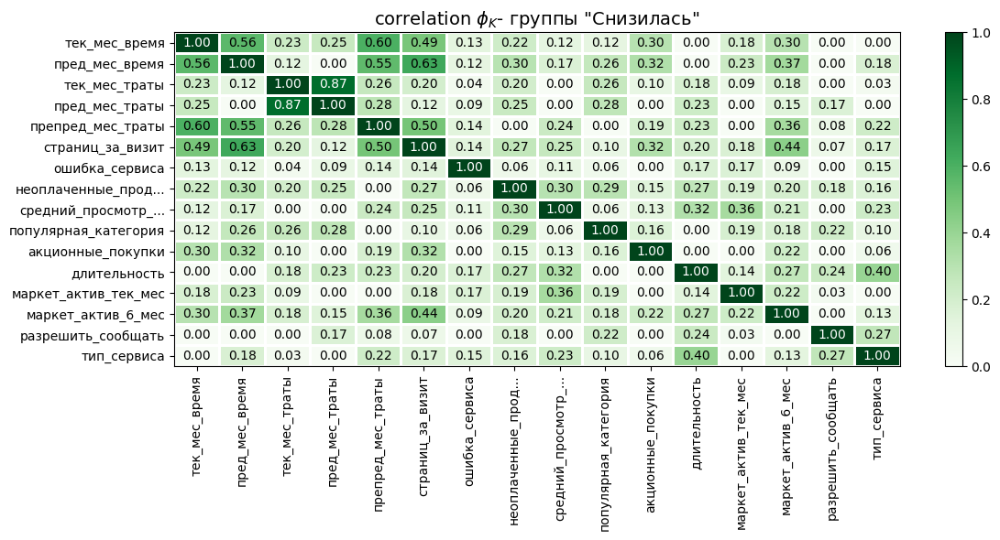

In [ ]:
# корреляционный анализ признаков в количественной шкале в итоговой таблице для моделирования, разделённой по таргету
interval_cols=['покупательская_активность', 'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', \
               'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', \
               'страниц_за_визит', 'препред_мес_траты', 'пред_мес_траты', 'тек_мес_траты', 'пред_мес_время', 'тек_мес_время']
phik_overview = phik_matrix(market[market['покупательская_активность'] == 'Прежний уровень'], interval_cols=interval_cols)
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$- группы "Прежний уровень"',
    fontsize_factor=1.0,
    figsize=(12, 6)
)
phik_overview = phik_matrix(market[market['покупательская_активность'] == 'Снизилась'], interval_cols=interval_cols)
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$- группы "Снизилась"',
    fontsize_factor=1.0,
    figsize=(12, 6)
)

<font color='green'> Коррелируют траты текущего месяца и предыдущего месяца - 0,87. <br>
Длительность посещений предыдущего месяца и страниц за визит - 0,63. <br>
Время посещения в текущем месяце и траты в позапрошлом месяце. - 0,6.

- Можно c помощью scatter_plot сконцентрироваться на связи между выручка текущая - выручка за прошлый. Там явная линейная зависимость, причем как будто бы множество точек тяготеют к двум прямым. Можно поискать факторы которые описывает эти два разных множества. Можно к выручке за прошлый месяц добавить выручку за позапрошлый месяц (или отнять) и тогда в каких то группировках по категориальным признакам будет очень четкая линейная зависимость достигающая по r2 за 0.9. Из этого можно сделать вывод что  в определенных группировках, зависимость между выручками за разные периоды практически дерерминирована (очень высокий показатель r2), то есть из выручки за прошлый (и с учетом позапрошлого месяца) мы можем точно спрогнозировать расходы клиента за текущий месяц. О чем это может говорить?



- Можно посмотреть scatter_plot между id и акционными покупками. Можно кое что интересное увидеть и дать этому обьяснение


1) Можно c помощью scatter_plot сконцентрироваться на связи между выручка текущая - выручка за прошлый. Там явная линейная зависимость, причем как будто бы множество точек тяготеют к двум прямым. <br>
<br>

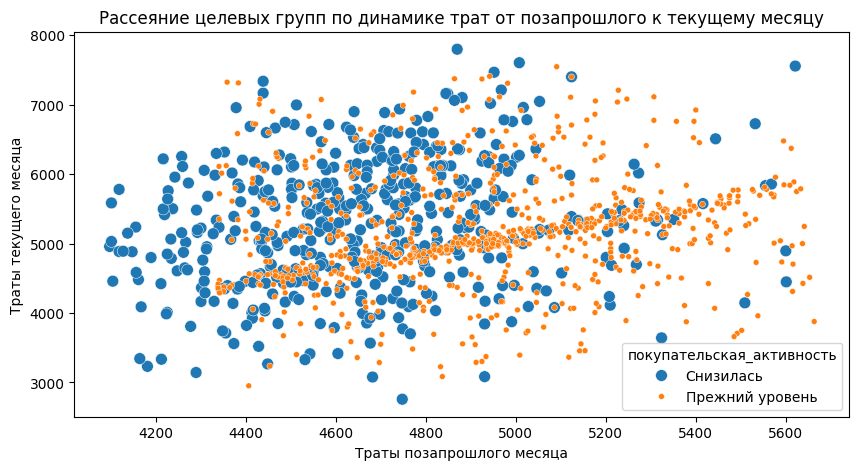

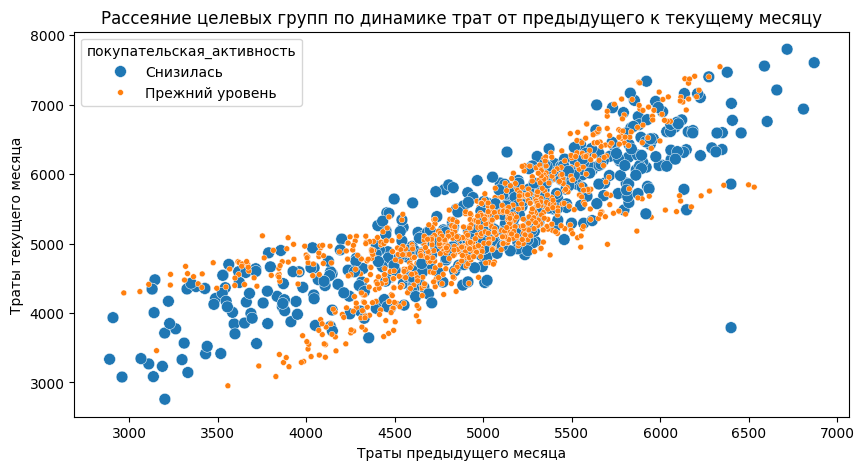

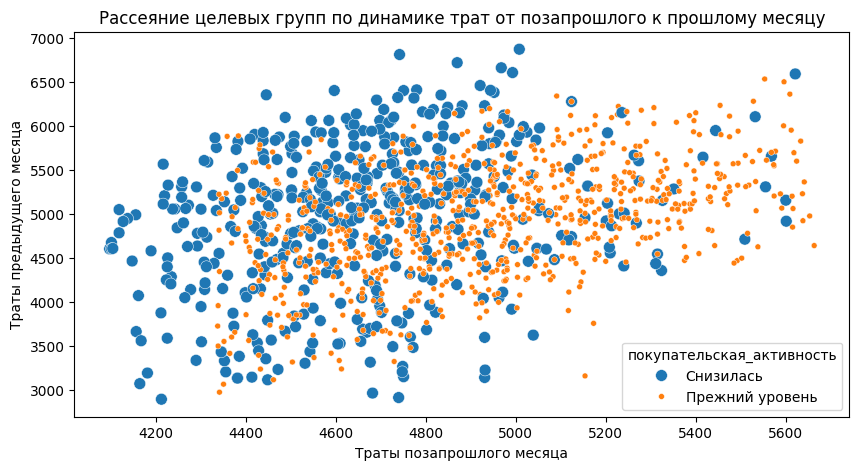

In [ ]:
# диаграммы рассеяния выручек
plt.figure(figsize = (10,5))
sns.scatterplot(x ='препред_мес_траты', y ='тек_мес_траты', data = market, hue ='покупательская_активность', size='покупательская_активность')
plt.title('Рассеяние целевых групп по динамике трат от позапрошлого к текущему месяцу');
plt.xlabel("Траты позапрошлого месяца")
plt.ylabel("Траты текущего месяца");

# диаграммы рассеяния выручек
plt.figure(figsize = (10,5))
sns.scatterplot(x ='пред_мес_траты', y ='тек_мес_траты', data = market, hue ='покупательская_активность', size='покупательская_активность')
plt.title('Рассеяние целевых групп по динамике трат от предыдущего к текущему месяцу');
plt.xlabel("Траты предыдущего месяца")
plt.ylabel("Траты текущего месяца");

# диаграммы рассеяния выручек
plt.figure(figsize = (10,5))
sns.scatterplot(x ='препред_мес_траты', y ='пред_мес_траты', data = market, hue ='покупательская_активность', size='покупательская_активность')
plt.title('Рассеяние целевых групп по динамике трат от позапрошлого к прошлому месяцу');
plt.xlabel("Траты позапрошлого месяца")
plt.ylabel("Траты предыдущего месяца");

<font color='green'> Относительно алгоритма определения уровня покупательской активности графики определяют фокусировку значений от последнего где старые данные и ещё непонятно - кто есть кто, к первому где видна точная фокусировка значений клиентов. Далее определим группу попавшую в этот фокус.

2) Можно поискать факторы которые описывают эти множества. <br>

<font color='green'>  На первом графике множество точек состоящих из категориального множества "прежний уровень" тяготеют к линейному распределению, это может говорить стабильном покупательском поведении - большая группа людей повторяет свои покупки. <br>
<br>Предположим, что покупательская активность такого рода зависит от категории товаров. Проверим

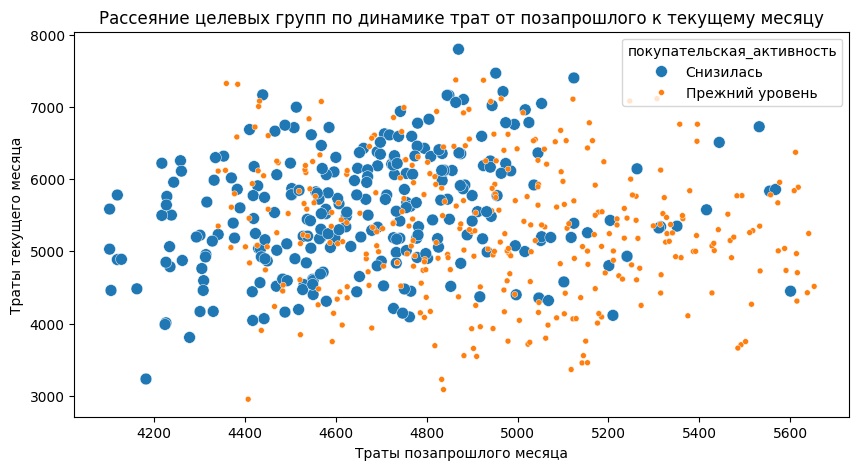

In [ ]:
market3 = market.copy()
list = ('Товары для детей', 'Домашний текстиль', 'Косметика и аксесуары', 'Кухонная посуда')
market3 = market3[#(market3['популярная_категория'] == 'Товары для детей')|
                (market3['популярная_категория'] == 'Домашний текстиль')|
                 (market3['популярная_категория'] == 'Косметика и аксесуары')|
                 (market3['популярная_категория'] == 'Кухонная посуда')
                 #(market3['популярная_категория'] == 'Мелкая бытовая техника и электроника')|
                 #(market3['популярная_категория'] == 'Техника для красоты и здоровья')
                 ]

# диаграммы рассеяния выручек
plt.figure(figsize = (10,5))
sns.scatterplot(x ='препред_мес_траты', y ='тек_мес_траты', data = market3, hue ='покупательская_активность', size='покупательская_активность')
plt.title('Рассеяние целевых групп по динамике трат от позапрошлого к текущему месяцу');
plt.xlabel("Траты позапрошлого месяца")
plt.ylabel("Траты текущего месяца");

<font color='green'>  Предположительно к такому поведению относятся клиенты, покупающие товары из категорий: <br>
'Товары для детей', 'Мелкая бытовая техника и электроника', 'Техника для красоты и здоровья'<br>

3) Можно к выручке за прошлый месяц добавить выручку за позапрошлый месяц (или отнять) и тогда в каких то группировках по категориальным признакам будет очень четкая линейная зависимость достигающая по r2 за 0.9. <br>
<br>

In [ ]:
# добавим показатель динамики роста с позапрошлого в прошлый месяца
market_ab = market.copy()
market_ab['ab'] = market_ab['пред_мес_траты']-market_ab['препред_мес_траты'] # выручка растёт для положительных значений
market_ab.shape

(1296, 18)

In [ ]:
# отфильтруем: выручка растёт
market_ab_max1 = market_ab[(market_ab['ab'] >= 0)]
market_ab_max1['популярная_категория'].value_counts()/market_ab_max1['популярная_категория'].count(),\
market_ab_max1['популярная_категория'].count()

(популярная_категория
 Домашний текстиль                       0.226075
 Товары для детей                        0.208044
 Косметика и аксесуары                   0.196949
 Кухонная посуда                         0.133148
 Мелкая бытовая техника и электроника    0.131761
 Техника для красоты и здоровья          0.104022
 Name: count, dtype: float64,
 721)

In [ ]:
# отфильтруем: выручка падает
market_ab_min3 = market_ab[(market_ab['ab'] < 0)]
market_ab_min3['популярная_категория'].value_counts()/market_ab_min3['популярная_категория'].count(),\
market_ab_min3['популярная_категория'].count()

(популярная_категория
 Товары для детей                        0.311304
 Техника для красоты и здоровья          0.186087
 Домашний текстиль                       0.151304
 Косметика и аксесуары                   0.140870
 Мелкая бытовая техника и электроника    0.137391
 Кухонная посуда                         0.073043
 Name: count, dtype: float64,
 575)

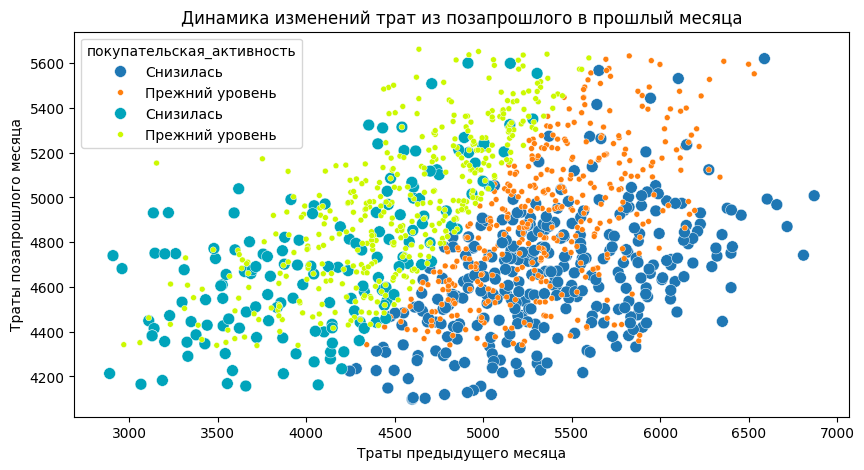

In [ ]:
# диаграммы рассеяния - выручка растёт / выручка падает  - с позапрошлого в прошлый месяца
plt.figure(figsize = (10,5))
sns.scatterplot(x ='пред_мес_траты', y ='препред_мес_траты', data = market_ab_max1, hue ='покупательская_активность', size='покупательская_активность')
sns.scatterplot(x ='пред_мес_траты', y ='препред_мес_траты', data = market_ab_min3, hue ='покупательская_активность', size='покупательская_активность', palette = "nipy_spectral")
plt.title('Динамика изменений трат из позапрошлого в прошлый месяца');
plt.xlabel("Траты предыдущего месяца")
plt.ylabel("Траты позапрошлого месяца");

Динамика трат с понижением отражается в левой верхней части: стали меньше тратить. ab<0  (зелёно-лимонный цвет)<br>
Динамика трат с повышением отражается в правой нижней части: стали больше тратить. ab>0 (сине-коричневый цвет) <br>

Покупательская активность (определённая кем-то по какому-то закону), имеет оба показателя в группах с падающей выручкой и растущей выручкой

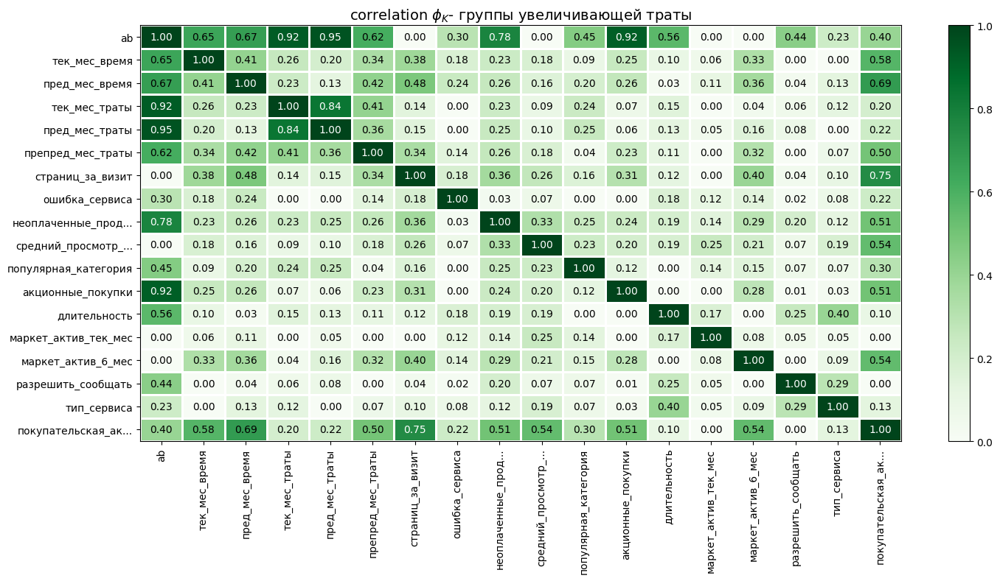

In [ ]:
# Корреляция с показателем роста трат
interval_cols=['маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', \
               'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', \
               'страниц_за_визит', 'препред_мес_траты', 'пред_мес_траты', 'тек_мес_траты', 'пред_мес_время', 'тек_мес_время']
phik_overview = phik_matrix(market_ab, interval_cols=interval_cols)
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$- группы увеличивающей траты',
    fontsize_factor=1.0,
    figsize=(15, 8)
)

<b><font color='green'> Показатель корреляции между ростом трат за предыдущие месяцы и текущими тратами - 0,92%.</font></b><br>

4) Из этого можно сделать вывод что в определенных группировках, зависимость между выручками за разные периоды практически дерерминирована (очень высокий показатель r2), то есть из выручки за прошлый (и с учетом позапрошлого месяца) мы можем точно спрогнозировать расходы клиента за текущий месяц. <br>
<br>
5) О чем это может говорить?<br>
<b><font color='green'> Это может говорить о том, что магазин ориентирован на товары повседневного спроса. Или имеет, какую-то систему мотивации .... <br>
А мы не сможем пользоваться коррелированными данными, поэтому при обучении модели данные о выручке за текущий период удалим. И при обучении модели будем пользоваться показателем ab.

In [ ]:
# добавим синтезированный параметр в основную базу данных. Показыват динамику роста трат
market['ab'] = market['пред_мес_траты']-market['препред_мес_траты']

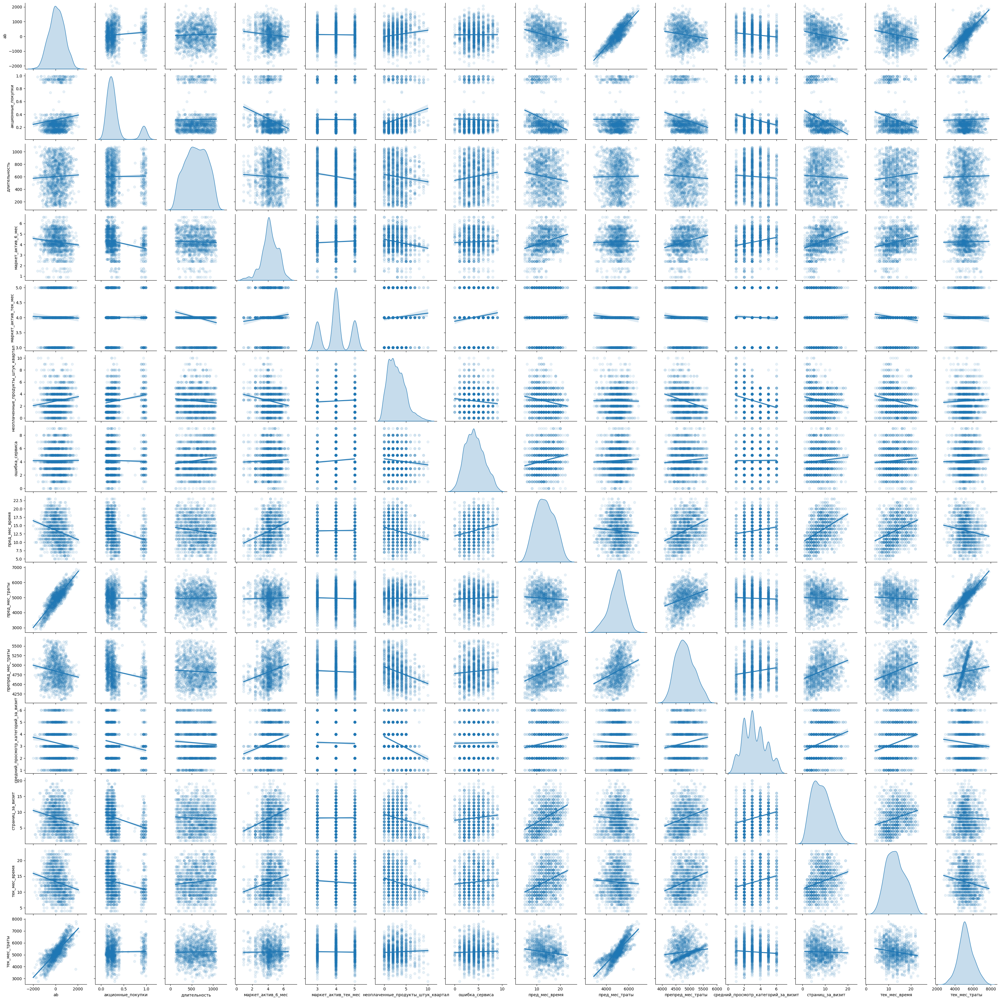

In [ ]:
# дополнительный анализ корреляции распределений и признака
train_dataset = market.copy()
train_dataset.insert(0, "MedHouseVal", market_file['покупательская_активность'])
_ = sns.pairplot(
    train_dataset[
        sorted(market)
    ],
    kind="reg",
    diag_kind="kde",
    plot_kws={"scatter_kws": {"alpha": 0.1}},
)

<font color='blue'> <h2>  Шаг 6. Использование пайплайнов

Применим все изученные модели. Для этого используем пайплайн. <br>
6.1 Для подготовки данных создадим пайплайн с использованием ColumnTransformer. Количественные и категориальные данные обработаем в пайплайне раздельно.<br>

1.	Признаки: тип_сервиса, разрешить_сообщать, <b>популярная_категория</b> - нужно кодировать с помощью OneHotEncoder.<br>
3.	В признаках, закодированных этими методами, пропусков нет.<br>
4.	<b>Целевой признак — 'покупательская_активность'.</b>
5.	Количественные признаки - 'маркет_актив_6_мес' и 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', 'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит', 'препред_мес_траты', 'пред_мес_траты', 'тек_мес_траты', 'пред_мес_время', 'тек_мес_время' -   нужно масштабировать.<br>
<br>

Напишем Pipeline для подготовки данных

In [ ]:
# Разделим данные, удалим коллинеарные столбцы
RANDOM_STATE = 42
TEST_SIZE = 0.25

X_train, X_test, y_train, y_test = train_test_split(
    market.drop(
        ['покупательская_активность', 'препред_мес_траты', 'пред_мес_траты', 'тек_мес_траты'],
        axis=1
    ),
    market['покупательская_активность'],
    test_size = TEST_SIZE,
    random_state = RANDOM_STATE,
    stratify = market['покупательская_активность']
)

# Pipeline для подготовки данных
# создаём списки с названиями признаков
ohe_columns = ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория']
num_columns = [
    'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность', 'акционные_покупки', \
    'средний_просмотр_категорий_за_визит', 'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', \
    'страниц_за_визит', 'пред_мес_время', 'тек_мес_время', 'ab'
              ]

# создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe',
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ohe',
            OneHotEncoder(drop='first')
        )
    ]
)

# создайте общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('num', StandardScaler(), num_columns)
    ],
    remainder = 'passthrough'
)

data_preprocessor.fit(X_train, y_train)

print(data_preprocessor)

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first'))]),
                                 ['тип_сервиса', 'разрешить_сообщать',
                                  'популярная_категория']),
                                ('num', StandardScaler(),
                                 ['маркет_актив_6_мес', 'маркет_актив_тек_мес',
                                  'длительность', 'акционные_покупки',
                                  'средний_просмотр_категорий_за_визит',
                                  'неоплаченные_продукты_штук_квартал',
                                  'ошибка_сервиса', 'страниц_за_визит',
                                  'пред_мес_время', 'тек_м

In [ ]:
# создадим экземпляр класса LabelEncoder для кодирования целевого признака
#label_encoder = LabelEncoder()

# обучим модель и трансформируем тренировочную выборку
#y_train_label = label_encoder.fit_transform(y_train)

# трансформируем тестовую выборку
#y_test_label = label_encoder.transform(y_test)

Совет 🤔:

- бывает полезно замерить время исполнения кода в ячейке, это можно сделать с помощью магической функции %%time    
 - в нашем проекте мы использовали pipeline со стандартными функциями sklearn (StandardScaler, MinMaxScaler итд итп), но ведь у нас может быть своя собственная функция преобразования данных. Например мы хотим заполняем пропуски средней в какой то группировке, но должны учесть логику моделирования, по которой мы можем использовать только данные из train (делаем .fit), а затем "обученную на train функцию преобразования" используем на test/valid (делаем .transform), по ссылкам можно посмотреть как это можно реализовать [Ссылка 1](https://dzen.ru/media/id/5ee6f73b7cadb75a66e4c7e3/sozdanie-polzovatelskih-preobrazovatelei-dannyh-62b2a9a80e49941961ffc7a2),
[Ссылка 2](https://towardsdatascience.com/pipelines-custom-transformers-in-scikit-learn-the-step-by-step-guide-with-python-code-4a7d9b068156)

Обратим внимание что мы создаем для этого класс, наследуя классы TransformerMixin и BaseEstimator, чтобы можно было применять  .fit(X_train), .predict(X_test)    
    
- для расширения кругозора: GridSearch/RandomizedSearch это классика, но есть и другие варианты подбора гиперпараметров, можешь [ознакомиться](https://www.freecodecamp.org/news/hyperparameter-optimization-techniques-machine-learning/). Выделю оptuna, очень много плюсов, причем изучение можно начать с [**OptunaSearchCV**](https://optuna.readthedocs.io/en/stable/reference/generated/optuna.integration.OptunaSearchCV.html). Интерфейс практически такой же, как у GridSearch/RandomizedSearch

6.2 Создадим пайплайн для поиска лучшей модели из изученных: KNeighborsClassifier(), DecisionTreeClassifier(), LogisticRegression(), SVC().<br>

roc_auc_score подсчитываем с помощью вероятности
    



6.3 Для каждой модели подберём как минимум один гиперпараметр. Масштабируем данные как минимум двумя методами.<br>
6.4 Чтобы выбрать лучшую модель, определимся с подходящей для моделей метрикой. Аргументируем свой выбор.<br>
<br>
Воспользуемся для оценки модели по числу ошибок обеих родов метрикой F1-мера, или F1-score.<br>
Так как для анализа покупательской активности нам нужно просто разделить по исходным признакам покупателей на активных и не активных. Чтобы потом влиять на тех кто скоро станет неактивным или тех кто стал не активным, но поведение говорит об обратном. Т.е. важны значения FN и FP.


Вообще в этом проекте можно использовать любую метрику, но  стоит правильно её обосновать  
F1-score Метрика которая одновременно учитывает precision и recall, поэтому вряд ли с её помощью получится оптимизировать значение гиперпараметров которых будет показывать минимальные значения FN и FP.
    
А вот если допустим нужно поймать как можно больше "снизились", то тогда используем метрику recall. А F1-score это просто хорошая метрика, которая старается учесть всё.  
    
  


In [ ]:
%%time

# пайплайн: подготовка данных
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])

param_grid = [
   # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 5),
        'models__max_features': range(2, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели KNeighborsClassifier()
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE,
            solver='liblinear',
            penalty='l1'
        )],
       'models__C': range(1, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели SVC()
    {
        'models': [SVC(
            random_state=RANDOM_STATE,
            kernel = 'poly',
            degree = 6
        )],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    }
]

grid = GridSearchCV(
    pipe_final,
    param_grid=param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1
)

grid.fit(X_train, y_train)

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('ЛУЧШАЯ МЕТРИКА НА КРОСВАЛИДАЦИИ:', grid.best_score_)

# проверим работу модели на тестовой выборке
# рассчитаем прогноз на тестовых данных
probas = grid.predict_proba(X_test)[:, 1]
print(f'Метрика roc_auc на тестовой выборке: {roc_auc_score(y_test, probas)}')

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first'))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('num', MinMaxScaler(),
                                                  ['маркет_актив_6_мес',
                                                   'маркет_актив_тек_мес',
           

In [ ]:
grid.best_params_

{'models': LogisticRegression(penalty='l1', random_state=42, solver='liblinear'),
 'models__C': 1,
 'preprocessor__num': MinMaxScaler()}

In [ ]:
result = pd.DataFrame(grid.cv_results_)
print(result[
    ['rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('rank_test_score'))

    rank_test_score                                       param_models  \
37                1  LogisticRegression(penalty='l1', random_state=...   
36                2  LogisticRegression(penalty='l1', random_state=...   
42                3  LogisticRegression(penalty='l1', random_state=...   
45                4  LogisticRegression(penalty='l1', random_state=...   
40                5  LogisticRegression(penalty='l1', random_state=...   
39                6  LogisticRegression(penalty='l1', random_state=...   
46                7  LogisticRegression(penalty='l1', random_state=...   
43                8  LogisticRegression(penalty='l1', random_state=...   
47                9  LogisticRegression(penalty='l1', random_state=...   
41               10  LogisticRegression(penalty='l1', random_state=...   
44               11  LogisticRegression(penalty='l1', random_state=...   
38               12  LogisticRegression(penalty='l1', random_state=...   
33               13                   

<font color='blue'> <h2> Шаг 7. Анализ важности признаков

In [ ]:
model = grid.best_estimator_.named_steps['models']
model

LogisticRegression(C=1, penalty='l1', random_state=42, solver='liblinear')

In [ ]:
grid.best_estimator_['preprocessor']

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 Pipeline(steps=[('simpleImputer_ohe',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ohe',
                                                  OneHotEncoder(drop='first'))]),
                                 ['тип_сервиса', 'разрешить_сообщать',
                                  'популярная_категория']),
                                ('num', MinMaxScaler(),
                                 ['маркет_актив_6_мес', 'маркет_актив_тек_мес',
                                  'длительность', 'акционные_покупки',
                                  'средний_просмотр_категорий_за_визит',
                                  'неоплаченные_продукты_штук_квартал',
                                  'ошибка_сервиса', 'страниц_за_визит',
                                  'пред_мес_время', 'тек_мес_время', 'ab'])])

In [ ]:
grid.best_estimator_['preprocessor'].get_feature_names_out()

array(['ohe__тип_сервиса_стандарт', 'ohe__разрешить_сообщать_нет',
       'ohe__популярная_категория_Косметика и аксесуары',
       'ohe__популярная_категория_Кухонная посуда',
       'ohe__популярная_категория_Мелкая бытовая техника и электроника',
       'ohe__популярная_категория_Техника для красоты и здоровья',
       'ohe__популярная_категория_Товары для детей',
       'num__маркет_актив_6_мес', 'num__маркет_актив_тек_мес',
       'num__длительность', 'num__акционные_покупки',
       'num__средний_просмотр_категорий_за_визит',
       'num__неоплаченные_продукты_штук_квартал', 'num__ошибка_сервиса',
       'num__страниц_за_визит', 'num__пред_мес_время',
       'num__тек_мес_время', 'num__ab'], dtype=object)

7.1 Оцените важность признаков для лучшей модели и постройте график важности с помощью метода SHAP. <br>

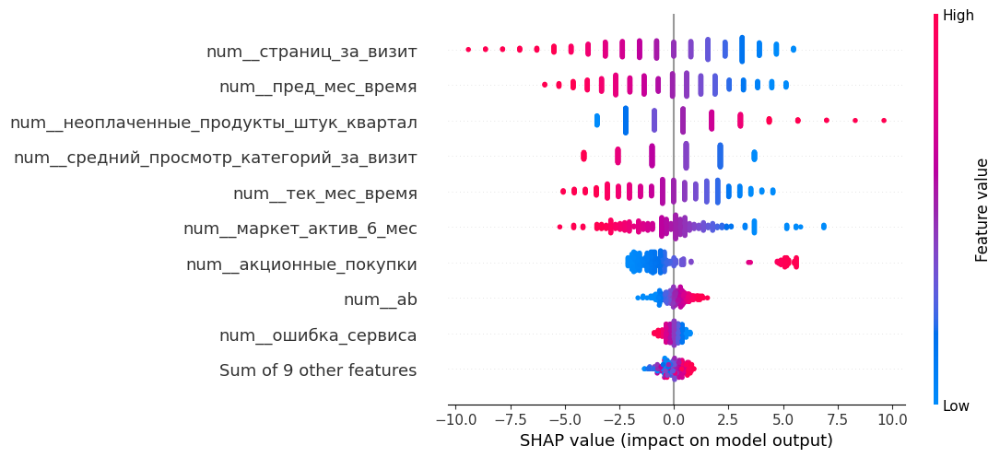

In [ ]:
X_test_t = pd.DataFrame(
    data_preprocessor.transform(X_test),
    columns=grid.best_estimator_['preprocessor'].get_feature_names_out().tolist()
)

explainer = shap.LinearExplainer(model, X_test_t)
shap_values = explainer(X_test_t)

shap.plots.beeswarm(shap_values)

Вытащить из pipeline модель так    

    .best_estimator_.named_steps['models']   
    
А для преобразования данных использовать
    
    .named_steps['preprocessor']

А новые названия столбцов в правильном порядке после этапа  preprocessor вытаскиваем так
    
    .best_estimator_.named_steps['preprocessor'].get_feature_names_out()
    
    
Если будут проблемы с .get_feature_names_out() нужно обновить библиотеку:
    
    !pip install -U scikit-learn
   
И перезапустить ядро

<b>Влияние основных показателей на принадлежность к классу 0 (Прежний уровень), положительная шкала Low:</b><br>
'страниц_за_визит',<br>
'пред_мес_время',<br>
'средний_просмотр_категорий_за_визит',<br>
'тек_мес_время',<br>
'маркет_актив_6_мес',<br>
'ошибка_сервиса'<br>
<br>
<b>Влияние основных показателей на принадлежность к классу 1 (Снизилась), положительная шкала High:</b><br>
'неоплаченные_продукты_штук_квартал',<br>
'акционные_покупки'<br>
'ab' - динамика трат<br>

In [ ]:
# посмотрим значения
y_pred = grid.predict(X_test)
y_pred[0:5]

array(['Прежний уровень', 'Снизилась', 'Прежний уровень', 'Снизилась',
       'Прежний уровень'], dtype=object)

In [ ]:
y_test[0:5]

id
216161    Прежний уровень
215654          Снизилась
216307    Прежний уровень
215501          Снизилась
215934          Снизилась
Name: покупательская_активность, dtype: object

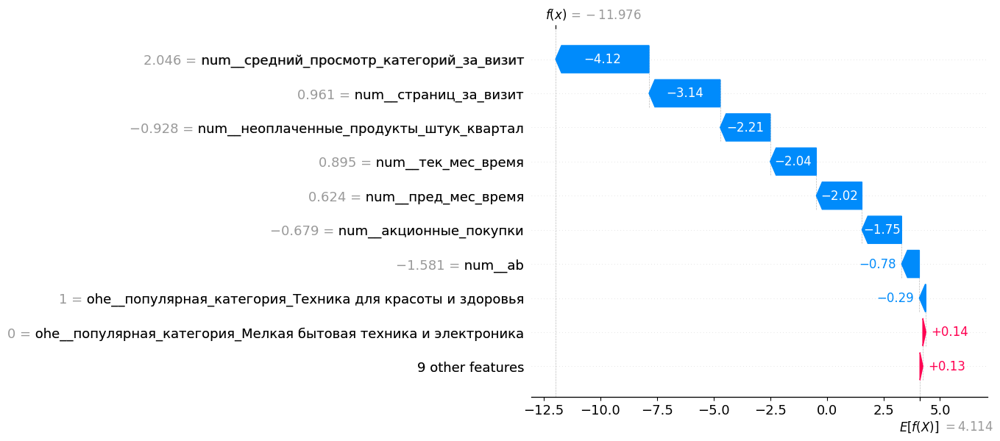

In [ ]:
# влияние параметров на принадлежность к категории 0 (Прежний уровень)
shap.plots.waterfall(shap_values[0])

Поведение для прежнего уровня покупательской активности.<br>
Сильнее всего на классификацию влияет признак "средний_просмотр_категорий_за_визит", "страниц_за_визит" : они «перетягивают» предсказание в сторону класса 0: прежний уровень

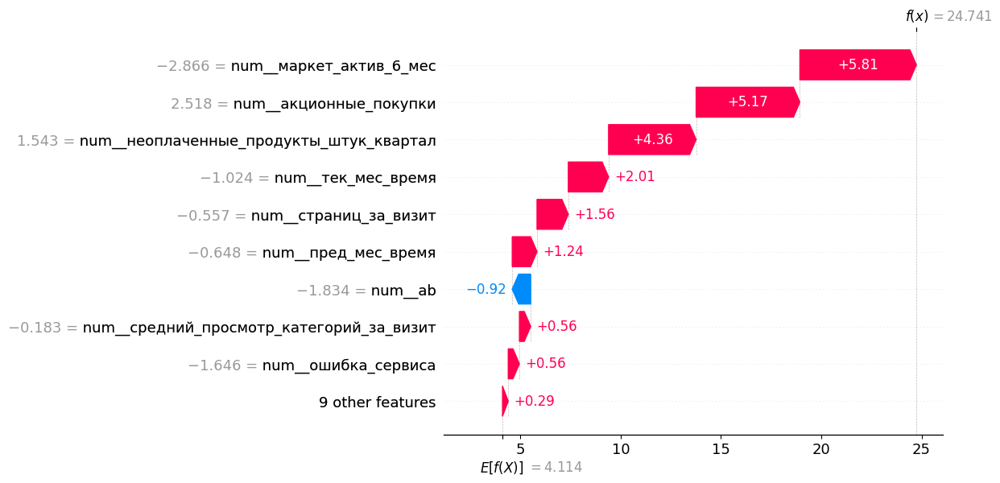

In [ ]:
shap.plots.waterfall(shap_values[1])

Сильнее всего на классификацию влияет признак "неоплаченные_продукты_штук_квартал", "средний_просмотр_категорий_за_визит": они «перетягивают» предсказание в сторону класса 1: Снизилась

Столбчатая диаграмма shap.plots.bar отражает общий вклад признаков в прогнозы модели. Она показывает средние SHAP-значения признака по всем наблюдениям.

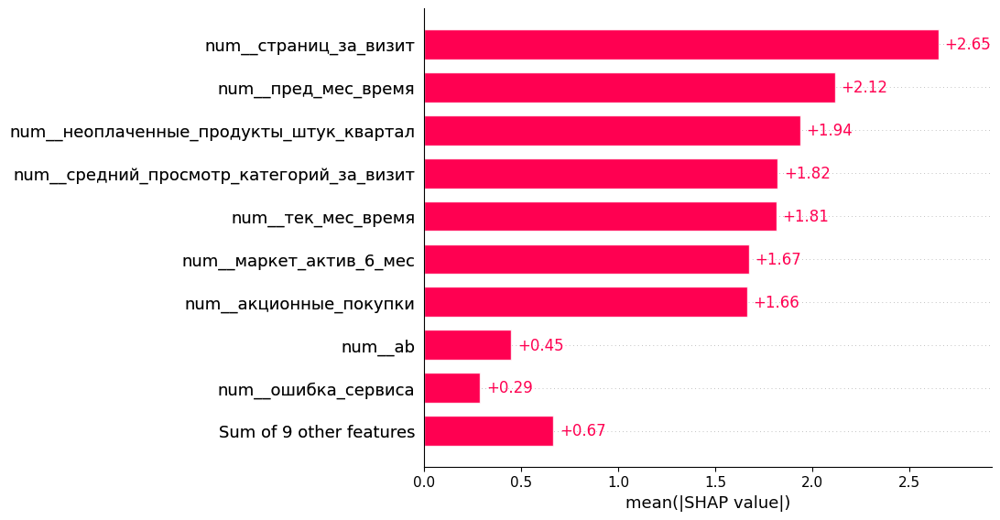

In [ ]:
shap.plots.bar(shap_values)

Каждому признаку соответствует свой столбец диаграммы, его размер отражает среднее SHAP‑значение по признаку. На сгенерированном датасете самый большой вес у признака "страниц за визит", он сильнее всего влияет на прогнозы модели.


In [ ]:
grid.best_estimator_['preprocessor'].get_feature_names_out()

array(['ohe__тип_сервиса_стандарт', 'ohe__разрешить_сообщать_нет',
       'ohe__популярная_категория_Косметика и аксесуары',
       'ohe__популярная_категория_Кухонная посуда',
       'ohe__популярная_категория_Мелкая бытовая техника и электроника',
       'ohe__популярная_категория_Техника для красоты и здоровья',
       'ohe__популярная_категория_Товары для детей',
       'num__маркет_актив_6_мес', 'num__маркет_актив_тек_мес',
       'num__длительность', 'num__акционные_покупки',
       'num__средний_просмотр_категорий_за_визит',
       'num__неоплаченные_продукты_штук_квартал', 'num__ошибка_сервиса',
       'num__страниц_за_визит', 'num__пред_мес_время',
       'num__тек_мес_время', 'num__ab'], dtype=object)

7.2 Сделайте выводы о значимости признаков:<br>
- какие признаки мало значимы для модели;<br>
 'тип_сервиса',<br>
 'разрешить_сообщать',<br>
 'длительность',<br>
 'популярная_категория',
 'маркет_актив_тек_мес',<br>
 'препред_мес_траты',<br>
<br>
- какие признаки сильнее всего влияют на целевой признак;<br>
'страниц_за_визит',<br>
'пред_мес_время',<br>
'неоплаченные_продукты_штук_квартал',<br>
'средний_просмотр_категорий_за_визит',<br>
'тек_мес_время',<br>
'маркет_актив_6_мес',<br>
'акционные_покупки',<br>
'ab', <br>
'ошибка_сервиса',<br>
<br>
- как можно использовать эти наблюдения при моделировании и принятии бизнес-решений.<br>
1) при появлении неоплаченных продуктов - предлагать скидку на товар в корзине<br>
2) маркетинговая активность в течение 6 мес. всё-таки положительно влияет на сохранение активности<br>
3) снижать количество ошибок сервиса<br>

Совет 🤔:

- можно и по-другому оценить важность признаков, это можно сделать с помощью [.feature_importance](https://inria.github.io/scikit-learn-mooc/python_scripts/dev_features_importance.html) (но не забываем что в логистической регрессии надо учесть логарифм в функция ошибки). Или с помощью [Permutation Importance](https://scikit-learn.org/stable/modules/permutation_importance.html)



<font color='blue'> <h2> Шаг 8. Сегментация покупателей

<b>8.1 Выполним сегментацию покупателей. Используем результаты моделирования и данные о прибыльности покупателей.</b><br>
<b>8.2 Выберем группу покупателей и предложим, как увеличить её покупательскую активность:</b> <br>
<b>8.3 Сделаем выводы о сегментах:</b>

Добавим к данным информацию о прибыльности<br>

In [ ]:
# сравним размеры
money.shape, market.shape

((1300, 2), (1296, 18))

In [ ]:
# Проверим соответствие id
# money['id'][~money['id'].isin(market_id['id'])]
# совместим данные по параметру id
market_id = market.copy()
market_id.reset_index(level=0, inplace=True)
market_full = market_id.join(money['Прибыль'], rsuffix= 'outer')
market_full.head()

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,препред_мес_траты,пред_мес_траты,тек_мес_траты,пред_мес_время,тек_мес_время,ab,Прибыль
0,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4472.0,5216.0,4971.6,12,10,744.0,0.98
1,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,4826.0,5457.5,5058.4,8,13,631.5,4.16
2,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,4793.0,6158.0,6610.4,11,13,1365.0,3.13
3,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,4594.0,5807.5,5872.5,8,11,1213.5,4.87
4,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,5124.0,4738.5,5388.5,10,10,-385.5,4.21


In [ ]:
market_full.shape

(1296, 20)

In [ ]:
# Подготовим данные всей базы под ранжирование по поведенческим признакам
X_market_p = pd.DataFrame(data_preprocessor.fit_transform
                          (market.drop(['покупательская_активность', 'препред_мес_траты', 'пред_мес_траты', 'тек_мес_траты'],axis=1)),\
                          columns=grid.best_estimator_['preprocessor'].get_feature_names_out().tolist())

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


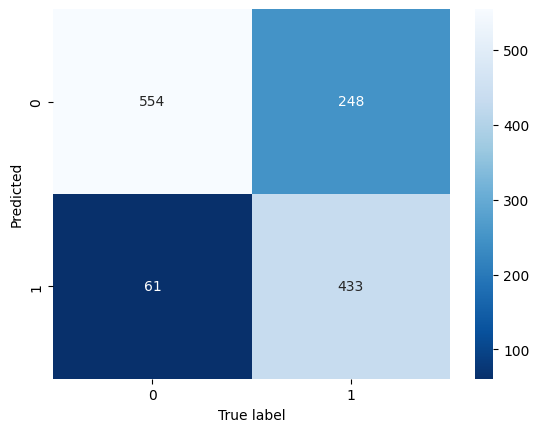

In [ ]:
# Построим матрицу предсказаний на основании лучшей модели всей базы относительно реальных значений целевого показателя
y_pred = model.predict(X_market_p)
y_true = market['покупательская_активность']
confusion = confusion_matrix(y_true, y_pred, labels=['Прежний уровень', 'Снизилась'])
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('Predicted')
plt.xlabel('True label');

554 - "Прежний уровень" - предсказания совпали: TN <br>
433- "Снизилась" - предсказания совпали: TP <br>
61 - Поведение клиентов говорит о том, что активность должна "снизиться" - но реальность говорит о "прежнем уровне": FN <br>
248 - Поведение клиентов говорит о том, что активность должна быть на "прежнем уровне" - но реальность говорит о "снижении": FP <br>

In [ ]:
y_true.value_counts()

покупательская_активность
Прежний уровень    802
Снизилась          494
Name: count, dtype: int64

In [ ]:
np.unique (y_pred, return_counts= True )

(array(['Прежний уровень', 'Снизилась'], dtype=object), array([615, 681]))

In [ ]:
# точность предсказания
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_true, y_pred)
acc

0.7615740740740741

<b> С помощью лучшей модели предскажем поведение покупателей.<br>

In [ ]:
# Предскажем вероятность принадлежности активность к какому-то классу с помощью лучшей модели
y_predict_proba = pd.DataFrame(data=model.predict_proba(X_market_p))
y_predict_proba = y_predict_proba.rename(columns ={0: 'Прежний_уровень', 1:'Снизилась'})
y_predict_proba

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


,Прежний_уровень,Снизилась
0,1.206203e-06,0.999999
1,2.422539e-02,0.975775
2,1.335682e-05,0.999987
3,2.462929e-08,1.000000
4,1.360541e-04,0.999864
...,...,...
1291,9.961609e-01,0.003839
1292,9.766038e-01,0.023396
1293,2.557889e-01,0.744211
1294,7.376290e-01,0.262371


<b>Выведем данные для маркетингового анализа

In [ ]:
# совместим данные с предсказанием и реальными значениями это поможет нам фильтровать FP, FN,
# а также в зависимости от требований маркетинга сдвигать границу
market_marketing = market_full[['id', 'покупательская_активность', 'Прибыль', 'популярная_категория', 'акционные_покупки', 'разрешить_сообщать', 'маркет_актив_6_мес']]
market_marketing = pd.concat([market_marketing, y_predict_proba], axis=1)
market_marketing.head()

,id,покупательская_активность,Прибыль,популярная_категория,акционные_покупки,разрешить_сообщать,маркет_актив_6_мес,Прежний_уровень,Снизилась
0,215349,Снизилась,0.98,Товары для детей,0.75,да,4.4,1.206203e-06,0.999999
1,215350,Снизилась,4.16,Домашний текстиль,0.14,нет,4.9,2.422539e-02,0.975775
2,215351,Снизилась,3.13,Товары для детей,0.99,да,3.2,1.335682e-05,0.999987
3,215352,Снизилась,4.87,Товары для детей,0.94,нет,5.1,2.462929e-08,1.000000
4,215353,Снизилась,4.21,Домашний текстиль,0.26,да,3.3,1.360541e-04,0.999864


<b>
- Сегментируем покупателей.<br>
- Проведём графическое и аналитическое исследование группы покупателей.<br>
- Сделаем предложения по работе с сегментом для увеличения покупательской активности.<br>

<b>FP

<font color='green'> FP Клиенты с поведением, которое говорит о его "Прежнем уровне", но уже имеющие статус "снизилась". Мы можем надеяться на таких клиентов и стимулировать их, всё-таки поведение у них активное.

In [ ]:
# : FP- Поведение клиентов говорит о том, что активность должна быть на "прежнем уровне" - но реальность говорит о "снижении"
market_marketing_FP = market_marketing.query('покупательская_активность == "Снизилась" & Прежний_уровень > 0.5')
market_marketing_FP.shape

(61, 9)

In [ ]:
# прибыль от таких клиентов
# market_marketing_FP['Прибыль'].hist()
# средняя прибыль от таких клиентов в сравнении со общей средней прибылью
market_marketing_FP['Прибыль'].sum()/market_marketing_FP['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(4.021803278688525, 3.9960725308641973)

<font color='green'><b> Предложим им скидки. Выведем всех, кто дал разрешение на сообщения.

In [ ]:
# : FP- Поведение клиентов говорит о том, что активность должна быть на "прежнем уровне" - но реальность говорит о "снижении"
market_marketing_FP_Yes = market_marketing.query('покупательская_активность == "Снизилась" & Прежний_уровень > 0.5 & разрешить_сообщать == "да"')
market_marketing_FP_Yes.shape

(42, 9)

<b>FN

<font color='green'> FN Клиенты с поведением, которое говорит о "Снижении" покупательской активности, но имеющие статус "Прежний уровень". Скорее всего это определившиеся клиенты, им постоянно нужны одни и те же товары, поэтому поведение предсказано, как "сниженное". <b>На эту группу можно оказать маркетинговое влияние, с целью мотивировать поизучать другие товарные группы.

In [ ]:
# : FN- Поведение клиентов говорит о том, что активность должна "снизиться" - но реальность говорит о "прежнем уровне"
market_marketing_FN = market_marketing.query('покупательская_активность == "Прежний уровень" & Снизилась > 0.5')
market_marketing_FN.shape

(248, 9)

In [ ]:
# market_marketing_FN['Прибыль'].hist()
market_marketing_FN['Прибыль'].sum()/market_marketing_FN['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(4.080927419354839, 3.9960725308641973)

<font color='green'> Проверим уровень маркетинговой активности в этой группе за последние полгода, относительно общего уровня. Покажем рекламу тем, у кого уровень ниже общего на 30%

In [ ]:
market_marketing_FN['маркет_актив_6_мес'].mean(), market['маркет_актив_6_мес'].mean()

(4.254435483870967, 4.256404320987654)

In [ ]:
level = market['маркет_актив_6_мес'].mean()
market_marketing_FN[market_marketing_FN['маркет_актив_6_мес'] < 0.7*level].shape

(14, 9)

<b>TN

<font color='green'> TN Прежний уровень активности - прежний уровень трат. Делать ничего не надо.

In [ ]:
# 753 "Прежний уровень" - предсказания совпали: TN
market_marketing_TN = market_marketing.query('покупательская_активность == "Прежний уровень" & Прежний_уровень > 0.5')
market_marketing_TN.shape

(554, 9)

In [ ]:
# market_marketing_TN['Прибыль'].hist()
market_marketing_TN['Прибыль'].sum()/market_marketing_TN['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(3.945559566787004, 3.9960725308641973)

<b>TP

<font color='green'> TP Активность снизилась по предсказанию модели, и в реальности тоже снизилась. Тратят они в среднем больше.

In [ ]:
# 387 - "Снизилась" - предсказания совпали: TP
market_marketing_TP = market_marketing.query('покупательская_активность == "Снизилась" & Снизилась > 0.5')
market_marketing_TP.shape

(433, 9)

In [ ]:
# market_marketing_TP['Прибыль'].hist()
market_marketing_TP['Прибыль'].sum()/market_marketing_TP['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(4.008475750577367, 3.9960725308641973)

In [ ]:
# Количество клиентов, с низким уровнем маркетинговой активности
level = market['маркет_актив_6_мес'].mean()
market_marketing_TP[market_marketing_TP['маркет_актив_6_мес'] < 0.7*level].shape

(94, 9)

In [ ]:
level

4.256404320987654

<b> Выведем клиентов с низкой активностью, которым недосталось маркетинговой стимуляции, но которые приносят высокую прибыль и которые согласны получать сообщения. Простимулируем их новыми предложениями из товаров других категорий - электроники.

In [ ]:

market_marketing_TP.query('маркет_актив_6_мес < 3 & Прибыль > 5 & разрешить_сообщать == "да"')['популярная_категория']

43                   Товары для детей
51     Техника для красоты и здоровья
52                  Домашний текстиль
101                  Товары для детей
162             Косметика и аксесуары
265                 Домашний текстиль
310                  Товары для детей
349                 Домашний текстиль
Name: популярная_категория, dtype: object

<b>Сегменты для дополнительного исследования</b><br>

<b>Высокий уровень прибыли для магазина.<br>
</b>Сегментируем высокоприбыльных покупателей, у которых высокие шансы стать категорией "снизилась", но кторые еще "активные", которым не досталось маркетинговой активности

In [ ]:
# - Высокоприбыльные покупатели, у которых высокие шансы стать категорией "снизилась"
market_marketing_Cash_High = market_marketing.query('Прибыль > 4 & Снизилась > 0.7 & маркет_актив_6_мес < 3.5 & покупательская_активность == "Прежний уровень"')
market_marketing_Cash_High.shape

(25, 9)

In [ ]:
market_marketing_Cash_High['популярная_категория'].value_counts()

популярная_категория
Товары для детей                        6
Косметика и аксесуары                   5
Домашний текстиль                       5
Техника для красоты и здоровья          4
Кухонная посуда                         3
Мелкая бытовая техника и электроника    2
Name: count, dtype: int64

In [ ]:
# сравнение средних значений трат покупателей с высоким уровнем относительно трат общего уровня
market_marketing_Cash_High['Прибыль'].sum()/market_marketing_Cash_High['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(4.8716, 3.9960725308641973)

<b>Низкий уровень <strike>трат</strike> прибыли - ничего с ними не делаем

In [ ]:
# - Покупатели с высоким уровнем трат
market_marketing_Cash_low = market_marketing.query('Прибыль < 4' )
market_marketing_Cash_low.shape

(625, 9)

In [ ]:
# сравнение средних значений трат покупателей с высоким уровнем относительно трат общего уровня
market_marketing_Cash_low['Прибыль'].sum()/market_marketing_Cash_low['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(3.156672, 3.9960725308641973)

In [ ]:
market_marketing_Cash_low['покупательская_активность'].value_counts()

покупательская_активность
Прежний уровень    392
Снизилась          233
Name: count, dtype: int64

In [ ]:
market_marketing_Cash_low['популярная_категория'].value_counts()

популярная_категория
Товары для детей                        153
Домашний текстиль                       114
Косметика и аксесуары                   105
Техника для красоты и здоровья           99
Мелкая бытовая техника и электроника     86
Кухонная посуда                          68
Name: count, dtype: int64

<b>Много акционных покупок<br>
Анализ доказывающий целесообразность стимулирования покупок по акциям для группы покупателей, у которых снизилась покупательская активность.

In [ ]:
# много акционных покупок
market_marketing_AK = market_marketing.query('акционные_покупки > 0.8')
market_marketing_AK.shape

(164, 9)

In [ ]:
# распределение целевых категорий в зависимости от акционной активности
market_marketing_AK['покупательская_активность'].value_counts()

покупательская_активность
Снизилась          131
Прежний уровень     33
Name: count, dtype: int64

In [ ]:
# сравнение средних значений трат покупателей с высоким акционным уровнем относительно трат общего уровня
market_marketing_AK['Прибыль'].sum()/market_marketing_AK['Прибыль'].count(), market_full['Прибыль'].sum()/ market_full['Прибыль'].count()

(4.0216463414634145, 3.9960725308641973)

<font color='green'> Покупатели делающие много акционных покупок, в среднем больше тратят. Их активность снизилась гораздо сильнее, чем в целом по магазину: 31/131 против 802/498

<b>Распределение товарных категорий в целевых группах

In [ ]:
market_marketing_TG1 = market_marketing.query('покупательская_активность == "Снизилась"')
market_marketing_TG1['популярная_категория'].value_counts()

популярная_категория
Товары для детей                        145
Косметика и аксесуары                   105
Домашний текстиль                       101
Кухонная посуда                          66
Техника для красоты и здоровья           50
Мелкая бытовая техника и электроника     27
Name: count, dtype: int64

In [ ]:
market_marketing_TG0 = market_marketing.query('покупательская_активность == "Прежний уровень"')
market_marketing_TG0['популярная_категория'].value_counts()

популярная_категория
Товары для детей                        184
Домашний текстиль                       149
Мелкая бытовая техника и электроника    147
Техника для красоты и здоровья          132
Косметика и аксесуары                   118
Кухонная посуда                          72
Name: count, dtype: int64

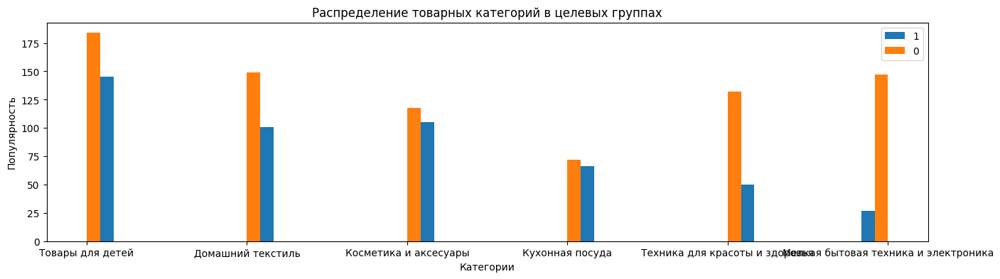

In [ ]:
# Наложим показатели
plt.figure(figsize=(16, 4))
plt.hist(market_marketing_TG1['популярная_категория'], bins=30, alpha = 1)
plt.hist(market_marketing_TG0['популярная_категория'], bins=60, alpha = 1)
plt.xlabel('Категории')
plt.ylabel('Популярность')
plt.title('Распределение товарных категорий в целевых группах')
plt.legend("10")
plt.show()

<font color='green'> Прежний уровень заинтересованности в категориях "Мелкой бытовой техники и электроники", "Техника для красоты и здоровья"<br>
Повышенный уровень снижения заинтересованноссти в группах "Косметика и аксессуары", "Кухонная посуда". <br>


1.
    
Выбираем сегмент и объясняем почему мы его выбрали. Тут делаем упор на бизнес - составляющую (мы ведь всем этим занимаемся не в сферическом вакууме, а для повышения экономической эффективности) и логику. Пример:


    "нас интересуют богатенькие клиенты, поэтому...", "нас интересуют те для кого модель предсказала высокую вероятность ухода, потому что...", "нас интересуют богатенькие и уходящие, потому что..."



- Или ориентируемся на результаты оценки важности признаков. Пример:


    "акционные покупки не показали высокую значимость на графиках shap, но если приглядеться, то yf графике beeswarm мы видим очень четкое разделение: высокие акционные покупики - высокая вероятность снижения, значит мы можем..."



    
    
2.    
    
У нас есть файл money, в нем содержится важная информация о прибыльности клиентов. Это наверно самый важный параметр с точки зрения бизнеса: клиент может много покупать, но прибыльность от него будет небольшой, или наоборот клиент может мало покупать, но он покупает товары которые продавать магазину выгодно. Чувствуешь разницу?! Стоит обогатить наши данные этой информацией
    
    
    
    
3.

Используем результаты моделирования, а иначе зачем мы все это делали?!  Можно использовать результат predict_proba посмотрев на уверенность модели в том что клиент снижает активность - вот и вариант сегментации.  Можно использовать модель как источник вдохновения для выбора признаков (если модель считает признак важным для прогноза активности, то логично посмотреть на него поближе). Можно приглядеться на графики shap.beeswarm, увидев там что то интересное. Или можно все это использовать вместе.  Кстати можно подглядеть внутрь моделей не только с помощью shap, но и построить [plot_tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html) и там подсмотреть  комбинацию признаков с конкретными порогами, сделав упор на признаки - причины. Например проанализировав   plot_tree мы можем увидеть что для такой то группы товаров, при таком то значении акционных покупок и при таком то сервисе, высока доля не снижающих активность клиентов (ничего такого на самом деле нет, это просто пример). И мы сможем сделать более сложные маркетинговые предложения.

Но, если ты хочешь использовать модель чтобы приглядеться к каким то признаками, то стоит различать  "признаки - индикатор", и "признаки - причины", а в разделе сегментация нам нужно дать маркетинговые предложения, то есть упор надо будет сделать на "признаки - причины", то есть на то что мы можем повлиять - акции, сервис, число ошибок при работе на сайте  итп. итд   

    


4.
    

   
-После выбора сегмента мы можем посмотреть усредненное лицо клиентов попавших в него, но сами по себе цифры нас не интересуют, нас интересует разница с клиентами не попавшими в сегмент. поэтому стоит проанализировать сегмент, указать на его отличия от остальных. для этого отлично подойдут графики countplot/pie (для категориальных) и гистограмму или boxplot (для количественных), а разбивке "наш сегмент" - "не наш сегмент"



5.
    
И в конце составляем индивидуальные маркетинговые предложения для выбранного сегмента - иначе для чего мы всё это делали!?  При этом  выводы не должны быть слишком общими, напрмиер предложение "предложить акцию", это слишком общее предложение, лучше указать для кого, по какой группе товаров итп итд
- хорошо, на сегменты мы разбили, проанализировали. Но для чего мы все это делали?! Стоит оставить индивидуальные маркетинговые предложения для выбранной группы  
    
Например - выяснили что есть две группы покупателей со сходными характеристиками, но у тех у кого премиум, активность такая то, а у кого стандарт - такая то, отсюда предложение раздать премиумы тому то и тому то. Или например выяснили что  существует какая то связь между акционными покупками и группами товаров, что есть какая то динамика по месяцам, или что существует какая то группа клиентов которая... итп итд (условно пишу)  
    
    

<div class="alert alert-warning">



Совет 🤔:




    
    


Вот перечень вариантов предложенных в проекте в качестве сегментов:

- Группа клиентом с максимальными акционными покупками и высокой вероятностью снижения покупательской активности.
- Группа клиентов, которые покупают только технику (покупают товары с длинным жизненным циклом)
- Группа клиентов, которые покупают товары из категории "Товары для себя" (можно ввести такую новую категорию на основе текущих) или "Товары для детей".
- Группа клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью

Самый очевидный и наверное логичный вариант - это рассмотреть сегмент клиентов с высокой вероятностью снижения покупательской активности и наиболее высокой прибыльностью. Тут сходится всё - и бизнесовая составляющая, и результаты моделирования мы используем)





Еще можно посмотреть на динамику выручки по месяцам, в группировке по категориальным признакам (популярная категория, тип сервиса, разрешить сообщить), возможно тут получится увидеть что то интересное и сделать какие то маркетинговые предложения. Отслеживание динамики, как и сравнение, отличный способ найти в данных что то интересное.


    

<font color='blue'> <h2>  Шаг 9. Общий вывод

Сделайте общий вывод:<br>
<b>- опишите задачу;</b><br>
Нужно предсказать пользователей, у которых будет снижение покупательскойй активности в следующие три месяца. Разбить клиентов на сегменты и дать рекомендации по мотивации.
<br><br>
<b>- опишите исходные данные и проведённую предобработку;</b><br>
Исходные данные представлены корректно, дополнительных преобразований не понадобилось.
<br><br>
<b>- напишите, что вы сделали для поиска лучшей модели;</b><br>
а) Для поиска лучшей модели были преобразованы в цифровые и масштабированы исходные данные несколькими способами.
Дополнительно можно было провести анализ лучших преобразований через полиномизацию.<br>
б) Выполнен поиск лучшей модели из четырех на основании метрики 'roc_auc'. Так как нам важно построить модель предсказания равномерно ошибающуюся при предсказании класса. По сути нам нужно знать границу пользовательского поведения, чтобы мочь делать прогнозы FP и FN. FP и FN описывают случаи, когда поведение может скоро измениться. <br>
<br>
FP - модель предсказывает снижение, а на самом деле еще "прежний уровень". Но модель сравнивает поведение с массой подобных "портретов", поэтому с какой-то долей вероятности, на самом деле произойдёт снижение.<br>
<br>
FN - модель предсказывает "прежний уровень", а на самом деле "снижение". Но модель сравнивает поведение с массой подобных "портретов", поэтому с какой-то долей вероятности, на самом деле произойдёт переход на "прежний уровень".<br>
<br><br>
<b>- укажите лучшую модель;</b><br>
Лучшая модель оказалась:
{'preprocessor__num': MinMaxScaler(),
 'models__C': 3,
 'models': LogisticRegression(C=3, penalty='l1', random_state=42, solver='liblinear')}
<br><br>
<b>- добавьте выводы и дополнительные предложения для выбранного сегмента покупателей.</b><br>
1) FP Клиенты с поведением, которое говорит о его "Прежнем уровне", но уже имеющие статус "снизилась". Мы можем надеяться на таких клиентов и стимулировать их, всё-таки поведение у них активное.
<br>
2) FN Клиенты с поведением, которое говорит о "Снижении" покупательской активности, но имеющие статус "Прежний уровень". Скорее всего это определившиеся клиенты, им постоянно нужны одни и те же товары, поэтому поведение предсказано, как "сниженное". На эту группу можно оказать маркетинговое влияние, с целью мотивировать поизучать другие товарные группы.<br>
3) TN Прежний уровень активности - прежний уровень прибыли. - делать ничего не надо<br>
4) TP Активность снизилась, а прибыль от них в среднем больше.  Клиентов с низкой активностью, которым недосталось маркетинговой стимуляции, но которые приносят высокую прибыль и которые согласны получать сообщения, простимулируем  новыми предложениями из товаров других категорий - например, электроники.<br>
Сегменты для дополнительного исследования:<br>
5) Высокий уровень прибыли для магазина. Клиенты с высокой покупательской активностью снижают активность больше чем в целом:<br>
Сегментируем высокоприбыльных покупателей, у которых высокие шансы стать категорией "снизилась", но кторые еще "активные", которым не досталось маркетинговой активности. <br>
6) Покупатели делающие много акционных покупок, в среднем меньше тратят. Их активность снизилась гораздо сильнее, чем в целом по магазину: 33/132 против 802/498<br>
7) "Прежний уровень" заинтересованности в категориях "Мелкой бытовой техники и электроники", "Техника для красоты и здоровья" имеет высокое значение относительно других категорий.<br>
Повышенный уровень снижения заинтересованноссти в группах "Косметика и аксессуары", "Кухонная посуда".<br>
<br>
<br>
<br>
<font color='green'> <b>Выводы:<br>
1) Были найдены значения вероятностей на основании поведения клиентов, которые предсказывают переход клиентов из категории "Прежний уровень" в категорию "Снизилась" с 76% вероятностью.<br>
2) В данном случае, нам важно выявить критерий на основании которого делятся клиенты на две категории, поэтому точность предсказания приемлема.<br>
3) Точность предсказания можно повышать:<br><br>
    а) удаляя наименее важные признаки методом L1 регуляризации;<br>
    б) повышая значимость признаков товарных категорий, с высоким процентом сохранности покупательской активности;<br>
    в) заменить значения акционных покупок на бинарные значения, до 0,5 - 0;  после 0,5 - 1.<br>
4) Используя эти значения можно сегментировать клиента любой группы с любой дельтой относительно границы перехода из одной группы в другую и стимулировать их спрос скидками, новыми предложениями, а также уровнем маркетинговой активности<br>
5) В основном - изменение поведения связано с товарным насыщением клиента. Но при этом "Техника" и "Электроника" таким свойством обладают в меньшей степени.<br>
6) Есть смысл подумать о внедрении других категориях.<br>
7) Скидки не помогают удерживать активность, но помогают удерживать прибыль с клиента<br>